In [2]:
## 20240308 NF/FF Flights with fixed pulsing cadence over WLC... (use WLC Site named for each polarization!)
## Group 1: ch0=Bicolog, ch1=Telescope_Y_NSpol
    ## 'FLY001Airdata.csv' - Altitude ~60m, Yaw ~0deg  --> FFNS
    ## 'FLY002Airdata.csv' - Altitude ~10m, Yaw ~0deg   --> NFNS
## Group 2: ch0=Telescope_X_EWpol, ch1=Bicolog
    ## 'FLY003Airdata.csv' - Altitude ~10m, Yaw ~90deg  --> NFEW
    ## 'FLY004Airdata.csv' - Altitude ~60m, Yaw ~90deg --> FFEW

##From loadD3Adata_Dallas.py:
from matplotlib.pyplot import *
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MultipleLocator
import numpy as np
import h5py
##From WT:
import datetime
import pytz
import os
import glob
from matplotlib import colors
import pandas
import csv
import pickle
%matplotlib inline
import beamcals
from beamcals import corr
from beamcals import concat
from beamcals import drone
from beamcals import bicolog
from beamcals import beammap
from beamcals import reduce_ccclass
import beamcals.plotting_utils as pu
import beamcals.fitting_utils as fu
import beamcals.geometry_utils as gu
import beamcals.time_utils as tu
import beamcals.reduce_ccclass as rc
from beamcals.sites import site
wlcsiteEW=site.site('../beamcals/beamcals/sites/WLC_config_EW20230519.npz')
wlcsiteNS=site.site('../beamcals/beamcals/sites/WLC_config_NS20230519.npz')

#phase unwrap:
from skimage.restoration import unwrap_phase

# Display settings:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [3]:
#Define some nice functions for this notebook: we use this to fit the phase fringes

from scipy.interpolate import griddata

def unwrap2d(phi_arr,wrap_args=(False,False)):
    naninds=np.isnan(phi_arr)
    mask_arr=np.zeros_like(phi_arr,dtype=bool)
    mask_arr[naninds]=True    
    phi_mask=np.ma.array(phi_arr,mask=mask_arr)
    phi_mask[naninds]=0.0
    phi_unwrap=unwrap_phase(phi_mask,wrap_around=wrap_args)
    phi_out=phi_unwrap.data-np.nanmean(phi_unwrap.data)
    phi_out[naninds]=np.nan
    phi_arr[naninds]=np.nan
    return(phi_out)

from scipy.optimize import least_squares
from scipy.optimize import curve_fit

# Solve for ABC st (drnpos•[A,B,C])==np.angle(V01) for drnpos in cut boundaries where geometric 
# phase contribution is nonnegligible

def Fringe_Fit(P,dronepos,V):
    A,B,C,D,E,F,G=P
    phase=(np.dot(dronepos+np.array([D,E,F])/np.abs(dronepos+np.array([D,E,F])),[A,B,C]))+G
    return phase-V

def Fringe(P,dronepos):
    A,B,C,D,E,F,G=P
    phase=(np.dot(dronepos+np.array([D,E,F])/np.abs(dronepos+np.array([D,E,F])),[A,B,C]))+G
    return phase

def Fringe_Fit(P,dronepos,V,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi-V

def Fringe(P,dronepos,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi

In [4]:
## These file paths should work if you're on rubin
pckldir="/hirax/20240308_WLC_NFandFF/products/pickles/"
gfitdir="/hirax/20240308_WLC_NFandFF/products/gfits/"
pcklarr=np.sort(os.listdir(pckldir))
gfitarr=np.sort(os.listdir(gfitdir))
print(pcklarr[:])
print(gfitarr[:])

['FLY001Airdata_20240308T172037Z_ver_20240409T153507_concat.pkl'
 'FLY002Airdata_20240308T183549Z_ver_20240409T154916_concat.pkl'
 'FLY003Airdata_20240308T191730Z_ver_20240409T161221_concat.pkl'
 'FLY004Airdata_20240308T195926Z_ver_20240409T162601_concat.pkl']
['FLY001Airdata_20240308T172037Z_2dGauss_and_Airy_Params.npz'
 'FLY002Airdata_20240308T183549Z_2dGauss_and_Airy_Params.npz'
 'FLY003Airdata_20240308T191730Z_2dGauss_and_Airy_Params.npz'
 'FLY004Airdata_20240308T195926Z_2dGauss_and_Airy_Params.npz']


In [5]:
#WL and Nyquist:
print('wavelengths:',(3e10/667.1875e6),(3e10/800.0e6))
print('Nyquist:',(3e10/667.1875e6)/2,(3e10/800.0e6)/2)

wavelengths: 44.96487119437939 37.5
Nyquist: 22.482435597189696 18.75


start of concat loop is: 2024-06-06 18:52:04.670900


/home/am3674/anaconda3/lib/python3.8/site-packages/beamcals/beammap.py:306: RuntimeWarning: divide by zero encountered in reciprocal
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/am3674/anaconda3/lib/python3.8/site-packages/beamcals/beammap.py:306: RuntimeWarning: invalid value encountered in multiply
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]


/home/am3674/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:229: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


/home/am3674/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:211: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


end of concat loop is: 2024-06-06 18:56:23.05885624,           


/home/am3674/anaconda3/lib/python3.8/site-packages/beamcals/beammap.py:367: RuntimeWarning: Mean of empty slice
  self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)


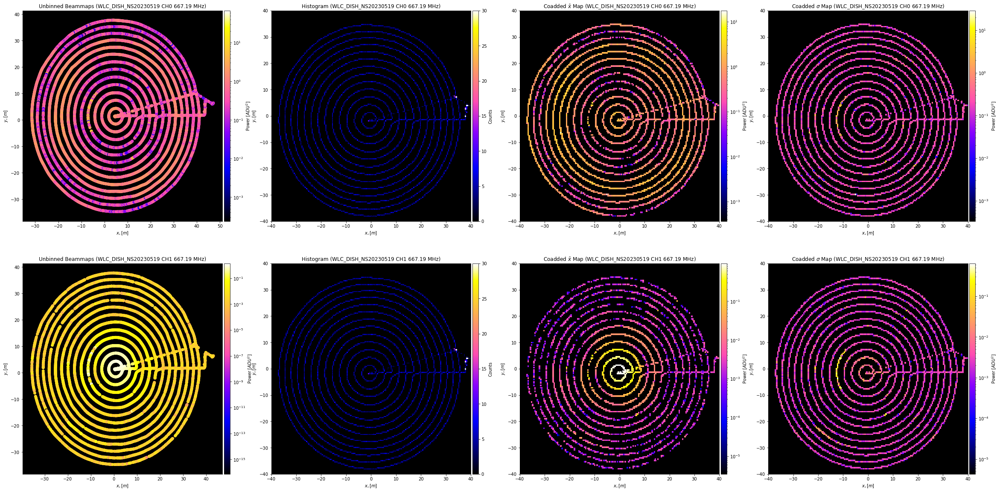

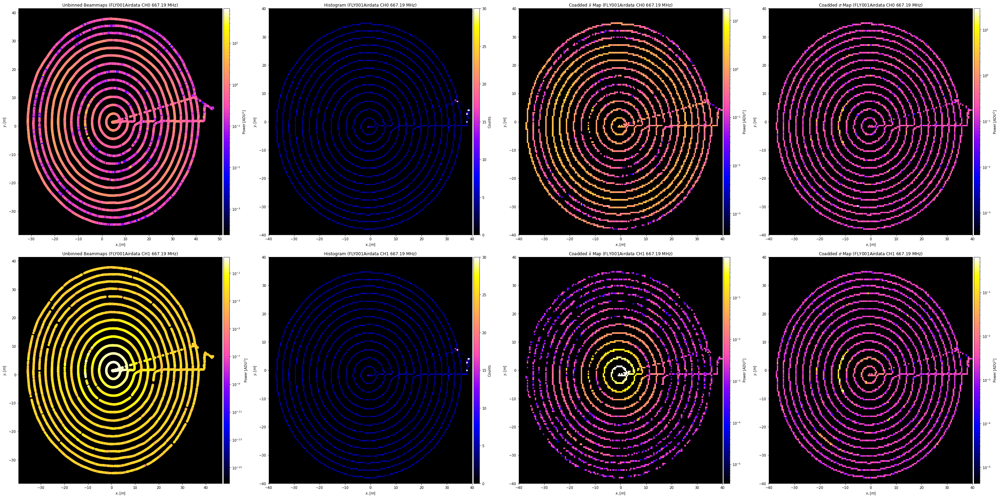

In [5]:
# Create the beammap class for FF Flight 1:

FFNSbeam=beammap.Beammap(concatlist=[pcklarr[0]],gfitlist=[gfitarr[0]],\
                         ## These parameters might be interesting to explore: [xmin,xmax,dx],[ymin,ymax,dy], frequency plotted
                         d0args=[-40,40,0.45],d1args=[-40,40,0.45],f_index_cc=340,\
                         normalization='Gauss',operation='coadd',
                         pickle_directory="/hirax/20240308_WLC_NFandFF/products/pickles/",\
                         gfit_directory="/hirax/20240308_WLC_NFandFF/products/gfits/",\
                         flightmasterpath="20240308_WLC_flights_forscripts.yaml",\
                         vplot=True,include_cross_data=True)

#export pickle for reduced class data for beammap function (include_cross_data=True will save V_cross_bgsub):
# thingy = rc.Smallify_comap(beamclass=testbeam,pickle_directory="/home/tyndall/Desktop/20240308_WLC_NFandFF/products/beam_pickles/",include_cross_data=True)
# print(thingy.tmppath)
# with open(thingy.tmppath, 'wb') as outp:
#     pickle.dump(thingy, outp, pickle.HIGHEST_PROTOCOL)
# print('DONE')

In [6]:
## Call the interpolation function from the beammap class

FFNSbeam.complex_interpolation(d0_interp=FFNSbeam.d0_centers[:,0], d1_interp=FFNSbeam.d1_centers[:,0],method='cubic',variogram_model='spherical',outputs=False,Fargs=[340,340])

/home/am3674/anaconda3/lib/python3.8/site-packages/numpy/lib/function_base.py:1540: RuntimeWarning: invalid value encountered in remainder
  ddmod = mod(dd + pi, 2*pi) - pi


<ipython-input-7-784ad50f04f2>:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax1.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],FFNSbeam.V_LC_cross.real[:,:,find,0,0])
<ipython-input-7-784ad50f04f2>:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax2.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],FFNSbeam.V_LC_cross.imag[:,:,find,0,0])
<ipython-input-7-784ad50f04f2>:7: MatplotlibDeprecationWarning: 

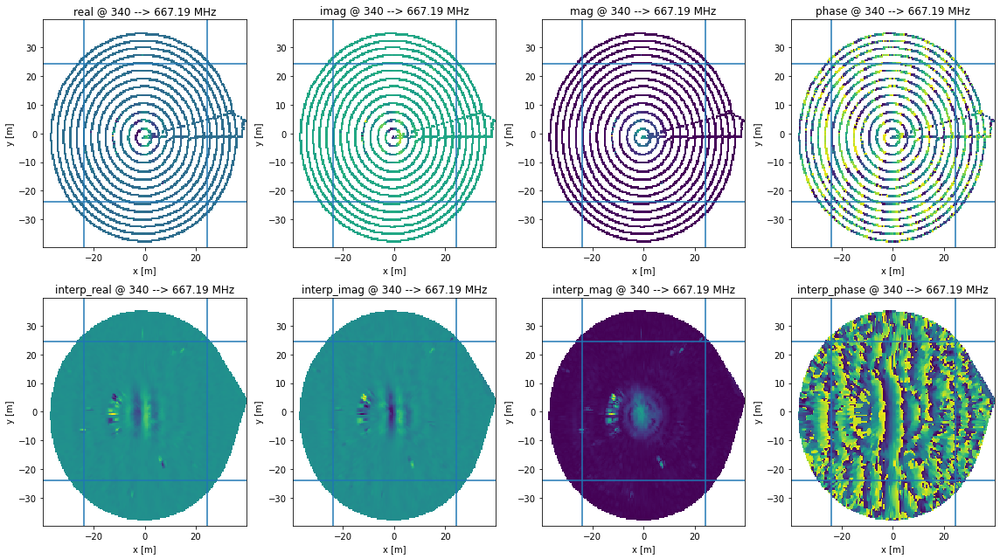

In [7]:
## plot the results of the interpolation and find where to cut to eliminate NAN values:

fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,9))
find=340
ax1.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],FFNSbeam.V_LC_cross.real[:,:,find,0,0])
ax2.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],FFNSbeam.V_LC_cross.imag[:,:,find,0,0])
ax3.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],np.abs(FFNSbeam.V_LC_cross)[:,:,find,0,0])#,norm=LogNorm())
ax4.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],np.angle(FFNSbeam.V_LC_cross)[:,:,find,0,0])

ax5.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],FFNSbeam.beam_linear_interp.real[:,:,find,0])
ax6.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],FFNSbeam.beam_linear_interp.imag[:,:,find,0])
ax7.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],FFNSbeam.beam_linear_interp_amp[:,:,find,0])#,norm=LogNorm())
ax8.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],FFNSbeam.beam_linear_interp_phase[:,:,find,0])

titles=['real','imag','mag','phase','interp_real','interp_imag','interp_mag','interp_phase']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i]+' @ {} --> {:.2f} MHz'.format(find,FFNSbeam.freq[find]))
    ax.set_xlabel('x [m]')
    ax.set_ylabel('y [m]')
    ## Plot the lines where we will do the reassignment/dimension change
    ax.axvline(FFNSbeam.d0_centers_grid[35,0,0])
    ax.axhline(FFNSbeam.d1_centers_grid[0,35,0])
    ax.axvline(FFNSbeam.d0_centers_grid[-35,0,0])
    ax.axhline(FFNSbeam.d1_centers_grid[0,-35,0])
    
tight_layout()

In [11]:
## This is where we reassign the arrays to a restricted range (inside the lines above)--this is to remove NaNs before interpolating
## Careful not to run this twice, or things will start to break!

stop # comment this out after you've run it once
xmin,xmax,ymin,ymax=[35,-35,35,-35]
FFNSbeam.beam_linear_interp=FFNSbeam.beam_linear_interp[xmin:xmax,ymin:ymax]
FFNSbeam.beam_linear_interp_amp=FFNSbeam.beam_linear_interp_amp[xmin:xmax,ymin:ymax]
FFNSbeam.beam_linear_interp_phase=FFNSbeam.beam_linear_interp_phase[xmin:xmax,ymin:ymax]
FFNSbeam.beam_linear_interp_phase_unwrapped=FFNSbeam.beam_linear_interp_phase_unwrapped[xmin:xmax,ymin:ymax]
FFNSbeam.histogram_LC=FFNSbeam.histogram_LC[xmin:xmax,ymin:ymax]
FFNSbeam.V_LC_cross=FFNSbeam.V_LC_cross[xmin:xmax,ymin:ymax]
FFNSbeam.V_LC_mean=FFNSbeam.V_LC_mean[xmin:xmax,ymin:ymax]
FFNSbeam.V_LC_operation=FFNSbeam.V_LC_operation[xmin:xmax,ymin:ymax]
FFNSbeam.V_LC_std=FFNSbeam.V_LC_std[xmin:xmax,ymin:ymax]
FFNSbeam.d0_centers_grid=FFNSbeam.d0_centers_grid[xmin:xmax,ymin:ymax]
FFNSbeam.d0_edges_grid=FFNSbeam.d0_edges_grid[xmin:xmax,ymin:ymax]
FFNSbeam.d1_centers_grid=FFNSbeam.d1_centers_grid[xmin:xmax,ymin:ymax]
FFNSbeam.d1_edges_grid=FFNSbeam.d1_edges_grid[xmin:xmax,ymin:ymax]
    
FFNSbeam.d0_centers=FFNSbeam.d0_centers[xmin:xmax]
FFNSbeam.d0_edges=FFNSbeam.d0_edges[xmin:xmax]
FFNSbeam.d1_centers=FFNSbeam.d1_centers[ymin:ymax]
FFNSbeam.d1_edges=FFNSbeam.d1_edges[ymin:ymax]

### The cell here is the main part where we unwrap the phase

There's some more fitting and stuff further down, but this is the main part!

<ipython-input-12-79d52d44af6d>:11: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im1=ax1.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi1,cmap='gnuplot2')
<ipython-input-12-79d52d44af6d>:12: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im2=ax2.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi1unwrap,cmap='gnuplot2')
<ipython-input-12-79d52d44af6d>:13: MatplotlibDeprecationWarning: shading='flat' w

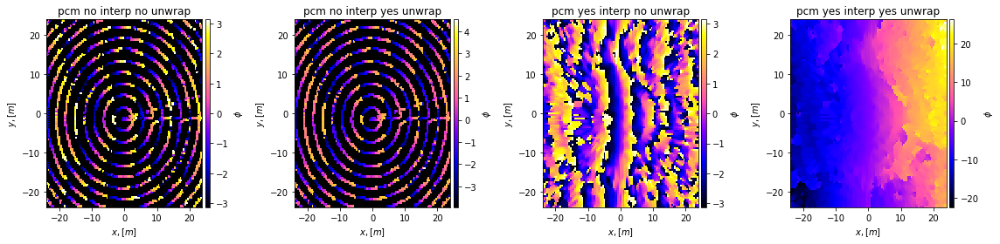

In [12]:
# Perform the phase unwrapping and plot the results, hopefully it appears as a gradient!
## pick a frequency by changing 'find', but be careful to change it in the other places it appears...

fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
find=344
phi1=np.angle(FFNSbeam.V_LC_cross[:,:,find,0,0])
phi1unwrap=unwrap2d(phi1)
phi_i=FFNSbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i)

im1=ax1.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi1,cmap='gnuplot2')
im2=ax2.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi1unwrap,cmap='gnuplot2')
im3=ax3.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi_i,cmap='gnuplot2')
im4=ax4.pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi_iunwrap,cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["pcm no interp no unwrap","pcm no interp yes unwrap","pcm yes interp no unwrap","pcm yes interp yes unwrap"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
# for ax in [ax2,ax5,ax6]:
#     ax.plot(range(-20,20),range(-20,20),'r-',linewidth=10)
tight_layout()


(A,B,C)=(5.393093,1.006482,-0.000378)
G=0.000


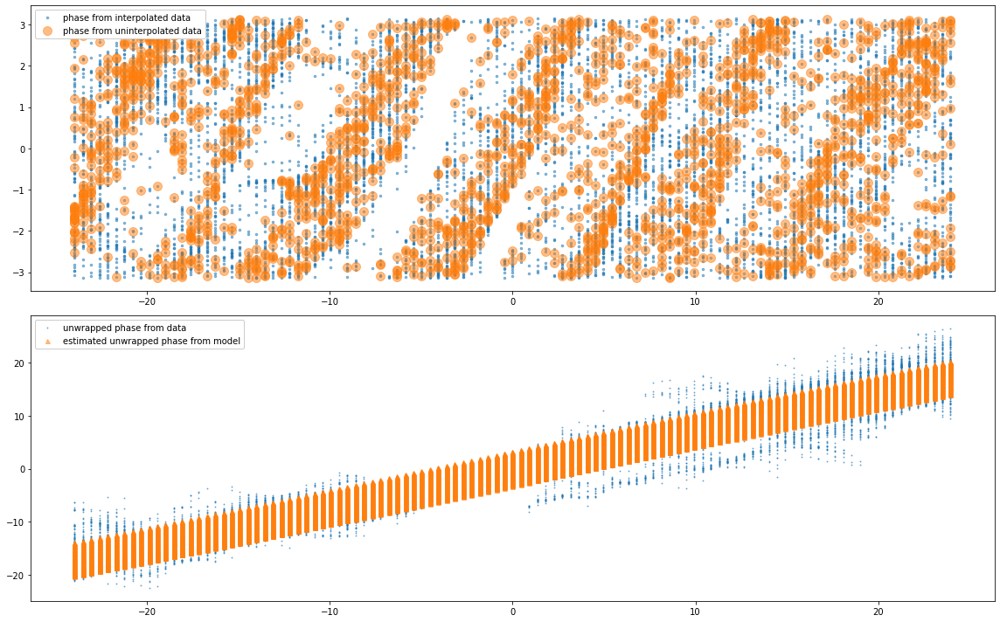

In [13]:
## Plot the wrapped and unwrapped phase, and see if a linear regression fits to the data... it should have a slope!

find=344

dx=FFNSbeam.d0_centers_grid[:,:,0]
dy=FFNSbeam.d1_centers_grid[:,:,0]
wl=(3.0e8/(FFNSbeam.freq[find]*1e6))
dc=(FFNSbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcabs=np.abs(FFNSbeam.V_LC_cross[:,:,find,0,0]).flatten()

phi1=np.angle(FFNSbeam.V_LC_cross[:,:,find,0,0])
phi1unwrap=unwrap2d(phi1)
phi_i=FFNSbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i)

dcang=phi_iunwrap.flatten()

dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(100*np.ones((dx.shape[0]*dx.shape[1]))).flatten()
unitvects=dcoords*np.outer(np.nansum((dcoords)**2.0,axis=1)**-0.5,np.ones(3))


def Fringe_Fit(P,dronepos,V,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi-V

def Fringe(P,dronepos,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi

popt=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvects[~np.isnan(dcang)],dcang[~np.isnan(dcang)],wl]).x
print("(A,B,C)=({:f},{:f},{:f})".format(popt[0],popt[1],popt[2]))
# print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[3]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,10))
ax1.plot(dcoords[:,0],phi_i.flatten(),'.',alpha=0.5,markersize=5,label='phase from interpolated data')
ax1.plot(dcoords[:,0],phi1.flatten(),'.',alpha=0.5,markersize=20,label='phase from uninterpolated data')
ax1.legend(loc=2,framealpha=1)
ax2.plot(dcoords[:,0],dcang,'.',alpha=0.5,markersize=2,label='unwrapped phase from data')
ax2.plot(dcoords[:,0],Fringe(np.array(popt),unitvects,wl),'^',alpha=0.5,markersize=5,label='estimated unwrapped phase from model')
ax2.legend(loc=2,framealpha=1)
tight_layout()


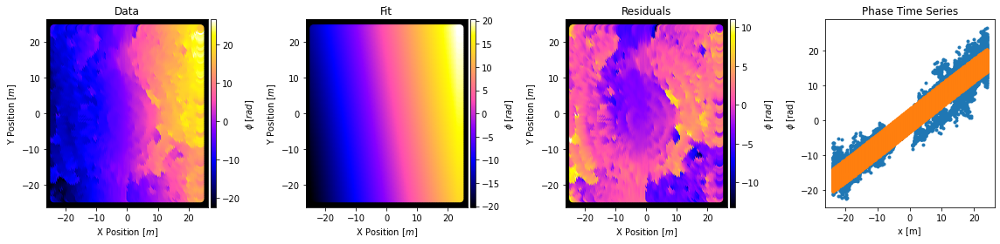

In [14]:
## Plot some stuff

fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im2=ax2.scatter(dx,dy,s=50,c=Fringe(popt,unitvects,wl),cmap='gnuplot2')
im3=ax3.scatter(dx,dy,s=50,c=(dcang-Fringe(popt,unitvects,wl)),cmap='gnuplot2')
ax4.plot(dcoords[:,0],dcang,'.')
ax4.plot(dcoords[:,0],Fringe(np.array(popt),unitvects,wl),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


<ipython-input-15-76aa03843eb7>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im1 = ax[0].pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi1,cmap='gnuplot2')
<ipython-input-15-76aa03843eb7>:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im2 = ax[1].pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi_i,cmap='gnuplot2')
<ipython-input-15-76aa03843eb7>:5: MatplotlibDeprecationWarning: shading='flat' w

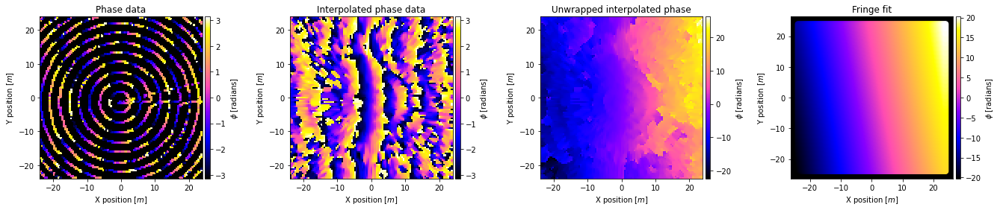

In [15]:
# plots for presentation
fig, ax = subplots(nrows=1,ncols=4, figsize=(23, 4))
im1 = ax[0].pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi1,cmap='gnuplot2')
im2 = ax[1].pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi_i,cmap='gnuplot2')
im3 = ax[2].pcolormesh(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],phi_iunwrap,cmap='gnuplot2') # the unwrapped interped data
im4 = ax[3].scatter(dx,dy,s=50,c=Fringe(popt,unitvects,wl),cmap='gnuplot2') # the fringe fit
# possibly add the final phase after it's subtracted?

images=[im1,im2,im3,im4]
titles=['Phase data','Interpolated phase data','Unwrapped interpolated phase','Fringe fit']
for i, ax in enumerate(ax):
    ax.set_facecolor('k')
    ax.set_xlabel('X position $[m]$')
    ax.set_ylabel('Y position $[m]$')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right',size='3%',pad=0.05)
    cbar=fig.colorbar(images[i],cax=cax)
    cbar.set_label('$\phi$ [radians]')
    ax.set_title(titles[i])
    ax.set_aspect('equal')

In [16]:
## Fitting loop for the fringing formula?

dx=FFNSbeam.d0_centers_grid[:,:,0]
dy=FFNSbeam.d1_centers_grid[:,:,0]
dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(97*np.ones((dx.shape[0]*dx.shape[1]))).flatten()
unitvects=dcoords*np.outer(np.nansum((dcoords)**2.0,axis=1)**-0.5,np.ones(3))

## I think this loop breaks when np.NaN occurs in the phi_i stage of the loop... going to check testbeam.beam_linear_interp_phase[:,:,find,0] for nan for each find...
fringepopt=np.NaN*np.ones((140,4))
fringedata=np.NaN*np.ones((107,107,140))
for k,find in enumerate(range(250,390)):
    print("{},{}".format(k,find),end='\r')
    wl=(3.0e8/(FFNSbeam.freq[find]/1e-6))
    dc=(FFNSbeam.V_LC_cross[:,:,find,0,0]).flatten()
    dcabs=np.abs(FFNSbeam.V_LC_cross[:,:,find,0,0]).flatten()
    phi_i=FFNSbeam.beam_linear_interp_phase[:,:,find,0]
    if True in np.isnan(FFNSbeam.beam_linear_interp_phase[:,:,find,0]):
        print('true, breaking loop to skip index {}'.format(k))
    else:
        phi_iunwrap=unwrap2d(phi_i,wrap_args=(False,True))
        dcang=phi_iunwrap.flatten()
        fringedata[:,:,k]=phi_iunwrap
        popt=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvects[~np.isnan(dcang)],dcang[~np.isnan(dcang)],wl]).x
        fringepopt[k,:]=popt    

true, breaking loop to skip index 136
true, breaking loop to skip index 138
true, breaking loop to skip index 139


I wouldn't make the gif if I were you but you can do it if you want. I didn't change some variable names from earlier parts of the code, so anytime you see testbeam you should change it to FFNSbeam. 

MovieWriter ffmpeg unavailable; using Pillow instead.


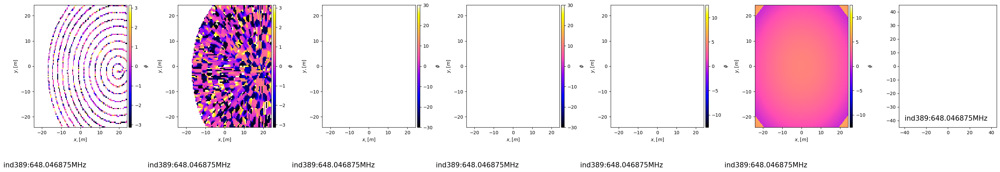

In [15]:
## Make the gif:
## can skip if annoying!

from matplotlib.animation import FuncAnimation
fig,[ax1,ax2,ax3,ax4,ax5,ax6,ax7]=subplots(nrows=1,ncols=7,figsize=(30,4.5))
cax1 = ax1.pcolormesh(dx, dy, np.angle(testbeam.V_LC_cross[:,:,250,0,0]), vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax2 = ax2.pcolormesh(dx, dy, testbeam.beam_linear_interp_phase[:,:,250,0], vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax3 = ax3.pcolormesh(dx, dy, fringedata[:,:,0], vmin=-30, vmax=30, cmap='gnuplot2')
cax4 = ax4.pcolormesh(dx, dy, Fringe(fringepopt[0,:],unitvects,wl).reshape(dx.shape), vmin=-30, vmax=30, cmap='gnuplot2')
cax5 = ax5.pcolormesh(dx, dy, fringedata[:,:,0]-Fringe(fringepopt[0,:],unitvects,wl).reshape(dx.shape), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')
cax6 = ax6.pcolormesh(dx, dy, (-2*(3e8/(testbeam.freq[250]*1e6))*np.sqrt((dx**2.0)+(dy**2.0)+(97.0**2.0)))%(2.0*np.pi), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')

images=[cax1,cax2,cax3,cax4,cax5,cax6]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$"]

for j,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    #ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
    
txt1=ax1.text(-40,-40, "", fontsize=15)
txt2=ax2.text(-40,-40, "", fontsize=15)
txt3=ax3.text(-40,-40, "", fontsize=15)
txt4=ax4.text(-40,-40, "", fontsize=15)
txt5=ax5.text(-40,-40, "", fontsize=15)
txt6=ax6.text(-40,-40, "", fontsize=15)
tight_layout()


def animate(vvv):
    cax1.set_array(np.angle(testbeam.V_LC_cross[:,:,250+vvv,0,0]))
    cax2.set_array(testbeam.beam_linear_interp_phase[:,:,250+vvv,0])
    cax3.set_array(fringedata[:,:,vvv])
    cax4.set_array(Fringe(fringepopt[vvv],unitvects,wl).reshape(dx.shape))
    cax5.set_array(fringedata[:,:,vvv]-Fringe(fringepopt[vvv],unitvects,wl).reshape(dx.shape))
    cax6.set_array((-2*(3e8/(testbeam.freq[vvv+250]*1e6))*np.sqrt((dx**2.0)+(dy**2.0)+(97.0**2.0)))%(2.0*np.pi))
    
    ax7.clear()
    ax7.plot(dcoords[:,0],fringedata[:,:,vvv].flatten(),'.')
    ax7.plot(dcoords[:,0],Fringe(np.array(fringepopt[vvv,:]),unitvects,(3.0e8/(testbeam.freq[vvv+250]/1e-6))).flatten(),'.')
    ax7.set_xlim(-45,45)
    ax7.set_ylim(-45,45)
    txt7=ax7.text(-40,-40, "", fontsize=15)
    
    txt1.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt2.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt3.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt4.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt5.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt6.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt7.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    print("{}".format(vvv),end='\r')

anim = FuncAnimation(fig, animate, interval=300, frames=140)
anim.save('../../Desktop/FFphase0308.gif')
show()

<ipython-input-17-60843d13ca97>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
<ipython-input-17-60843d13ca97>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')


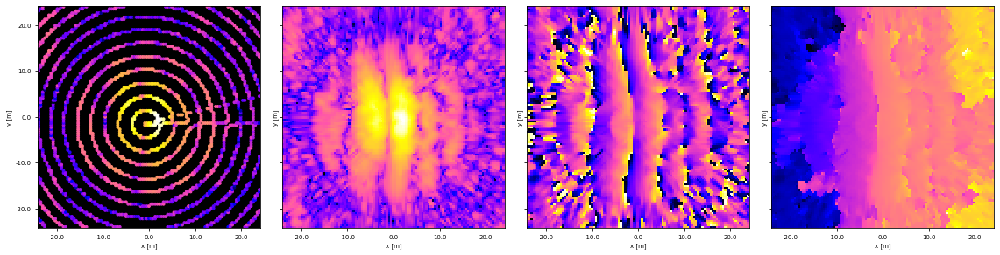

In [17]:
## This was where i was making plots for a presentation, nothing vital here!
# Will made these and it's just more plots of the phase
FFNSbeam.beam_linear_interp_phase_unwrapped.shape

fig,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4),sharex=True,sharey=True)
ax1.set_facecolor('k')
find=270
ax1.scatter(FFNSbeam.d0_centers_grid[:,:,0],FFNSbeam.d1_centers_grid[:,:,0],c=np.abs(FFNSbeam.V_LC_cross[:,:,find,0,0]),cmap='gnuplot2',s=8,norm=LogNorm())
#ax1.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],(testbeam.V_LC_mean[:,:,find,0,0]),cmap='gnuplot2',norm=LogNorm())
ax2.pcolormesh(FFNSbeam.d0_edges_grid[:,:,0],FFNSbeam.d1_edges_grid[:,:,0],(FFNSbeam.beam_linear_interp_amp[:,:,find,0]),cmap='gnuplot2',norm=LogNorm())
ax1.set_xlim(ax2.get_xlim())
ax1.set_ylim(ax2.get_ylim())
ax3.pcolormesh(FFNSbeam.d0_edges_grid[:,:,0],FFNSbeam.d1_edges_grid[:,:,0],FFNSbeam.beam_linear_interp_phase[:,:,find,0],cmap='gnuplot2')
ax4.pcolormesh(FFNSbeam.d0_edges_grid[:,:,0],FFNSbeam.d1_edges_grid[:,:,0],fringedata[:,:,find-250],cmap='gnuplot2')

for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('x [m]',fontsize='x-small')
    ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
    #ax.set_xticks([])
    ax.set_ylabel('y [m]',fontsize='x-small')
    ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')
    #ax.set_yticks([])
    ax.set(aspect='equal')


tight_layout()


<ipython-input-18-30f7ef31d341>:12: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax[0].pcolormesh(dx, dy, fringedata[:,:,zez])
<ipython-input-18-30f7ef31d341>:13: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax[1].pcolormesh(dx, dy, Fringe(fringepopt[zez],dcoords,wl).reshape(dx.shape),cmap='gnuplot2')
<ipython-input-18-30f7ef31d341>:17: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either 

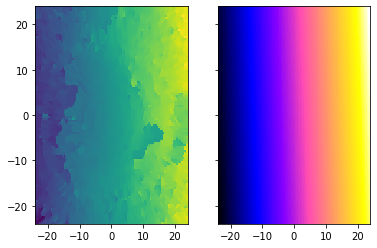

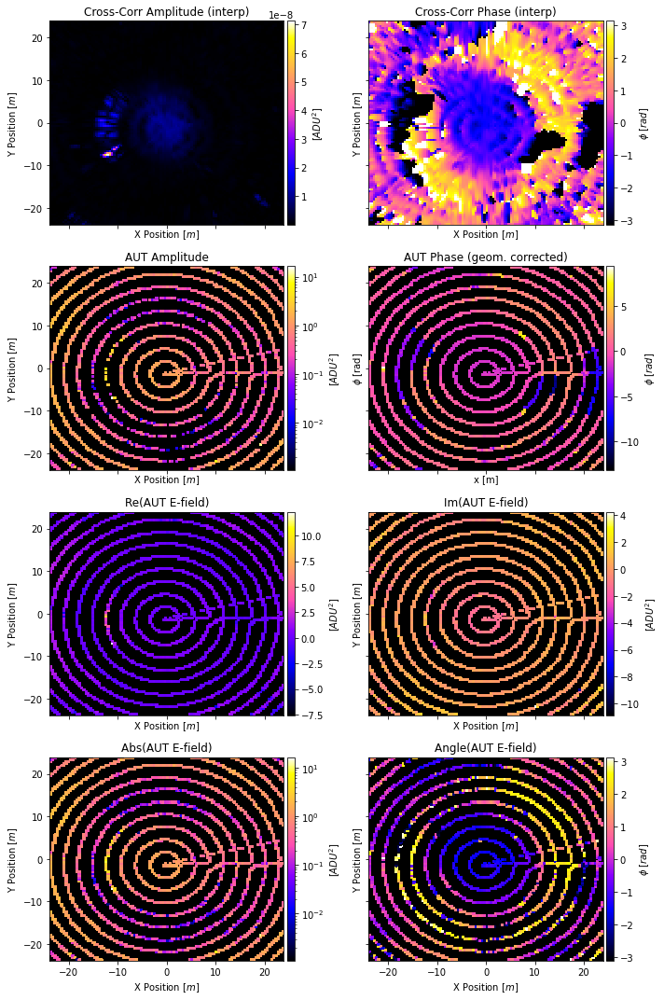

In [18]:
# here, we put the phase and the amplitude together into a complex electric field

find=331
wl=(3.0e10/(FFNSbeam.freq[find]/1e-6))
zez=find-250
# zez=0
ampl=FFNSbeam.V_LC_mean[:,:,250+zez,0,0]
nanmask=ampl/ampl
phase=fringedata[:,:,zez]-Fringe(fringepopt[zez],dcoords,wl).reshape(dx.shape)
phasefactor=np.e**(1.0j*phase)
cplxEfieldNSFF=ampl*phasefactor

fig,ax=subplots(nrows=1,ncols=2,sharex=True,sharey=True)
ax[0].pcolormesh(dx, dy, fringedata[:,:,zez])
ax[1].pcolormesh(dx, dy, Fringe(fringepopt[zez],dcoords,wl).reshape(dx.shape),cmap='gnuplot2')


fig,[[ax1,ax2],[ax3,ax4],[ax5,ax6],[ax7,ax8]]=subplots(nrows=4,ncols=2,figsize=(10,15),sharex=True,sharey=True)
im1=ax1.pcolormesh(dx, dy, FFNSbeam.beam_linear_interp_amp[:,:,250+zez,0], cmap='gnuplot2')
im2=ax2.pcolormesh(dx, dy, phase, cmap='gnuplot2',vmin=-np.pi, vmax=np.pi)
im3=ax3.pcolormesh(dx, dy, ampl, norm=LogNorm(), cmap='gnuplot2')
im4=ax4.pcolormesh(dx, dy, nanmask*phase, cmap='gnuplot2')
im5=ax5.pcolormesh(dx, dy, np.real(cplxEfieldNSFF), cmap='gnuplot2')
im6=ax6.pcolormesh(dx, dy, np.imag(cplxEfieldNSFF), cmap='gnuplot2')
im7=ax7.pcolormesh(dx, dy, np.abs(cplxEfieldNSFF),cmap='gnuplot2', norm=LogNorm())
im8=ax8.pcolormesh(dx, dy, np.angle(cplxEfieldNSFF), cmap='gnuplot2')

images=[im1,im2,im3,im4,im5,im6,im7,im8]
cbars=['[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','[$ADU^2$]','[$ADU^2$]','$\phi$ [$rad$]']
titles=["Cross-Corr Amplitude (interp)","Cross-Corr Phase (interp)","AUT Amplitude","AUT Phase (geom. corrected)","Re(AUT E-field)","Im(AUT E-field)","Abs(AUT E-field)","Angle(AUT E-field)"]
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


In [33]:
# NEARFIELD FLIGHT 1: 
#   NS Polarization
#   18m Altitude


All the steps here are basically the same, just for the NF, so it's not annotated as much.

In [34]:
## To prepare data for the NF2FF code, we need to determine the electric field in both polarizations:
## NF File 1: ch0=Bicolog, ch1=Telescope_Y_NSpol --> ## 'FLY781.csv' - Altitude ~18m, Yaw ~0deg --> NFNS18
## NF File 2: ch0=Telescope_X_EWpol, ch1=Bicolog
    ## 'FLY782.csv' - Altitude ~18m, Yaw ~90deg  --> NFEW18
    ## 'FLY783.csv' - Altitude ~20m, Yaw ~90deg  --> NFEW20   
    
print(pcklarr)


['FLY001Airdata_20240308T172037Z_ver_20240409T153507_concat.pkl'
 'FLY002Airdata_20240308T183549Z_ver_20240409T154916_concat.pkl'
 'FLY003Airdata_20240308T191730Z_ver_20240409T161221_concat.pkl'
 'FLY004Airdata_20240308T195926Z_ver_20240409T162601_concat.pkl']


start of concat loop is: 2024-06-06 23:27:05.538034


/home/am3674/anaconda3/lib/python3.8/site-packages/beamcals/beammap.py:306: RuntimeWarning: divide by zero encountered in reciprocal
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/am3674/anaconda3/lib/python3.8/site-packages/beamcals/beammap.py:306: RuntimeWarning: invalid value encountered in multiply
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]


/home/am3674/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:229: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


/home/am3674/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:211: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


end of concat loop is: 2024-06-06 23:30:53.14753824,           


/home/am3674/anaconda3/lib/python3.8/site-packages/beamcals/beammap.py:367: RuntimeWarning: Mean of empty slice
  self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)


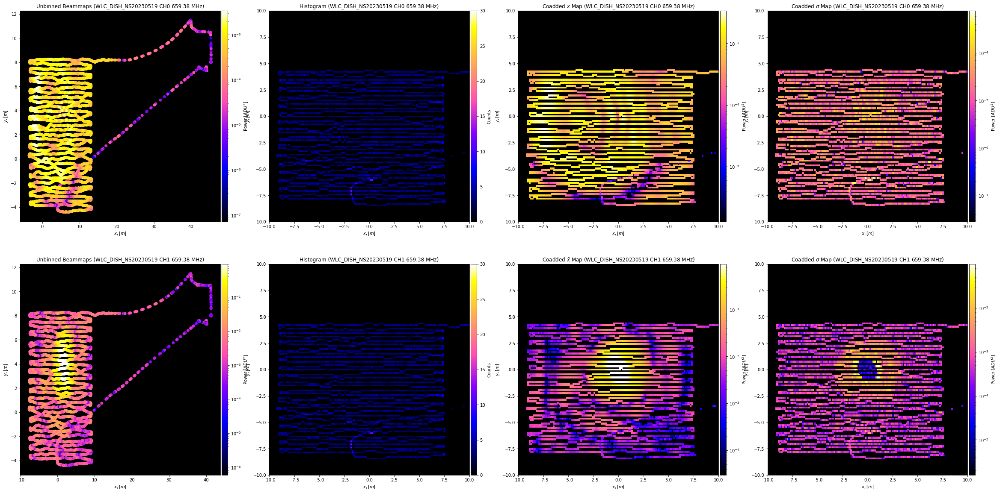

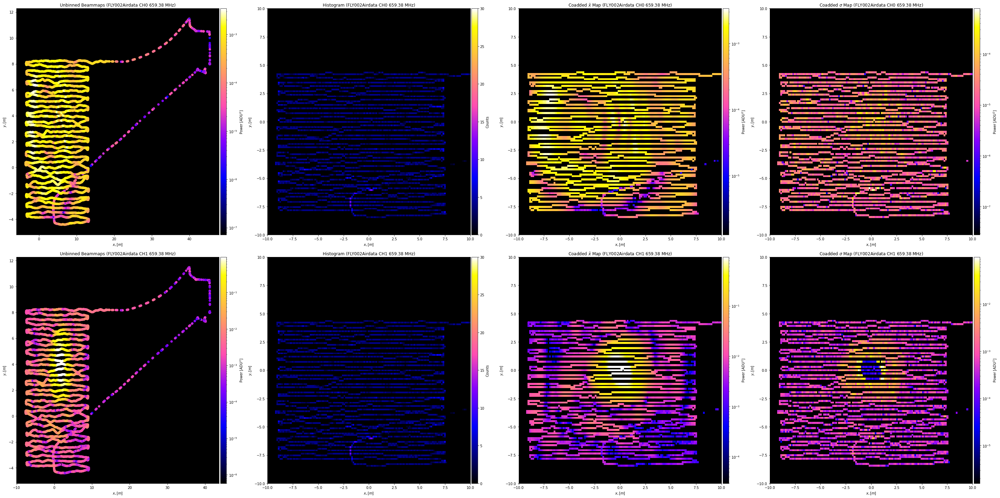

In [35]:
# Create the beammap class for NF Flight 1:

NFNSbeam=beammap.Beammap(concatlist=[pcklarr[1]],gfitlist=[gfitarr[1]],\
                         d0args=[-10,10,0.15],d1args=[-10,10,0.15],f_index_cc=360,\
                         normalization='Gauss',operation='coadd',
                         pickle_directory="/hirax/20240308_WLC_NFandFF/products/pickles/",\
                         gfit_directory="/hirax/20240308_WLC_NFandFF/products/gfits/",\
                         flightmasterpath="20240308_WLC_flights_forscripts.yaml",\
                         vplot=True,include_cross_data=True)

#export pickle for reduced class data for beammap function (include_cross_data=True will save V_cross_bgsub):
# thingy = rc.Smallify_comap(beamclass=testbeam,pickle_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/beam_pickles/",include_cross_data=True)
# print(thingy.tmppath)
# with open(thingy.tmppath, 'wb') as outp:
#     pickle.dump(thingy, outp, pickle.HIGHEST_PROTOCOL)
# print('DONE')

In [36]:
NFNSbeam.complex_interpolation(d0_interp=NFNSbeam.d0_centers[:,0], d1_interp=NFNSbeam.d1_centers[:,0],method='cubic',variogram_model='spherical',outputs=False,Fargs=[340,340])

/home/am3674/anaconda3/lib/python3.8/site-packages/numpy/lib/function_base.py:1540: RuntimeWarning: invalid value encountered in remainder
  ddmod = mod(dd + pi, 2*pi) - pi


<ipython-input-37-75b9ff580099>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax1.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],NFNSbeam.V_LC_cross.real[:,:,find,0,0])
<ipython-input-37-75b9ff580099>:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax2.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],NFNSbeam.V_LC_cross.imag[:,:,find,0,0])
<ipython-input-37-75b9ff580099>:5: MatplotlibDeprecationWarnin

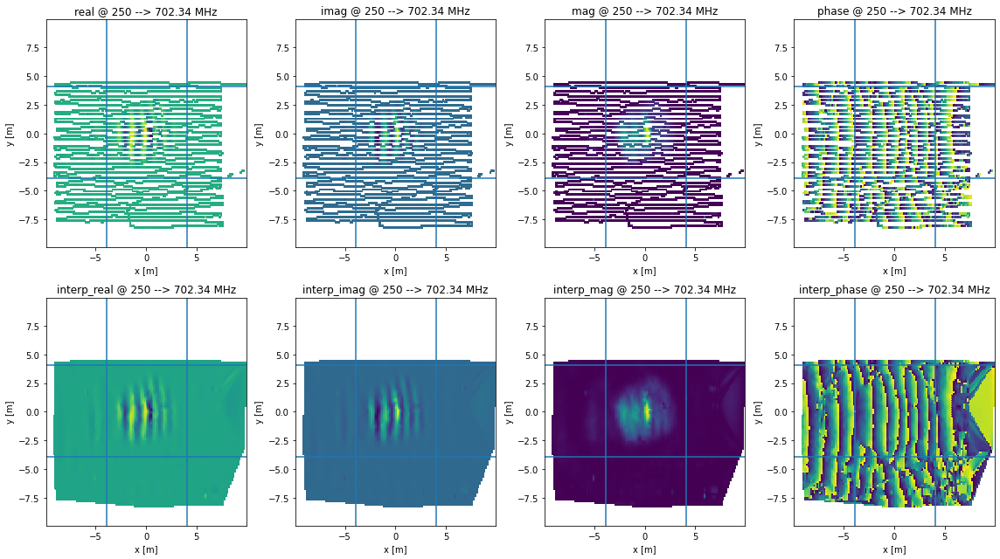

In [37]:
fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,9))
find=250
ax1.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],NFNSbeam.V_LC_cross.real[:,:,find,0,0])
ax2.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],NFNSbeam.V_LC_cross.imag[:,:,find,0,0])
ax3.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],np.abs(NFNSbeam.V_LC_cross)[:,:,find,0,0])#,norm=LogNorm())
ax4.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],np.angle(NFNSbeam.V_LC_cross)[:,:,find,0,0])

ax5.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],NFNSbeam.beam_linear_interp.real[:,:,find,0])
ax6.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],NFNSbeam.beam_linear_interp.imag[:,:,find,0])
ax7.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],NFNSbeam.beam_linear_interp_amp[:,:,find,0])#,norm=LogNorm())
ax8.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],NFNSbeam.beam_linear_interp_phase[:,:,find,0])

titles=['real','imag','mag','phase','interp_real','interp_imag','interp_mag','interp_phase']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i]+' @ {} --> {:.2f} MHz'.format(find,NFNSbeam.freq[find]))
    ax.set_xlabel('x [m]')
    ax.set_ylabel('y [m]')
    ax.axvline(NFNSbeam.d0_centers_grid[40,0,0])
    ax.axhline(NFNSbeam.d1_centers_grid[0,40,0])
    ax.axvline(NFNSbeam.d0_centers_grid[-40,0,0])
    ax.axhline(NFNSbeam.d1_centers_grid[0,-40,0])
tight_layout()

In [38]:
NFNSbeam.beam_linear_interp_amp.shape

(133, 133, 1024, 1)

In [39]:
stop
xmin,xmax,ymin,ymax=[40,-40,40,-40]
NFNSbeam.beam_linear_interp=NFNSbeam.beam_linear_interp[xmin:xmax,ymin:ymax]
NFNSbeam.beam_linear_interp_amp=NFNSbeam.beam_linear_interp_amp[xmin:xmax,ymin:ymax]
NFNSbeam.beam_linear_interp_phase=NFNSbeam.beam_linear_interp_phase[xmin:xmax,ymin:ymax]
NFNSbeam.beam_linear_interp_phase_unwrapped=NFNSbeam.beam_linear_interp_phase_unwrapped[xmin:xmax,ymin:ymax]
NFNSbeam.histogram_LC=NFNSbeam.histogram_LC[xmin:xmax,ymin:ymax]
NFNSbeam.V_LC_cross=NFNSbeam.V_LC_cross[xmin:xmax,ymin:ymax]
NFNSbeam.V_LC_mean=NFNSbeam.V_LC_mean[xmin:xmax,ymin:ymax]
NFNSbeam.V_LC_operation=NFNSbeam.V_LC_operation[xmin:xmax,ymin:ymax]
NFNSbeam.V_LC_std=NFNSbeam.V_LC_std[xmin:xmax,ymin:ymax]
NFNSbeam.d0_centers_grid=NFNSbeam.d0_centers_grid[xmin:xmax,ymin:ymax]
NFNSbeam.d0_edges_grid=NFNSbeam.d0_edges_grid[xmin:xmax,ymin:ymax]
NFNSbeam.d1_centers_grid=NFNSbeam.d1_centers_grid[xmin:xmax,ymin:ymax]
NFNSbeam.d1_edges_grid=NFNSbeam.d1_edges_grid[xmin:xmax,ymin:ymax]
    
    
NFNSbeam.d0_centers=NFNSbeam.d0_centers[xmin:xmax]
NFNSbeam.d0_edges=NFNSbeam.d0_edges[xmin:xmax]
NFNSbeam.d1_centers=NFNSbeam.d1_centers[ymin:ymax]
NFNSbeam.d1_edges=NFNSbeam.d1_edges[ymin:ymax]

<ipython-input-40-cdcb4ac08f08>:8: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im1=ax1.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],phi1NS,cmap='gnuplot2')
<ipython-input-40-cdcb4ac08f08>:9: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im2=ax2.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],phiunwrapNS,cmap='gnuplot2')
<ipython-input-40-cdcb4ac08f08>:10: MatplotlibDeprecationWarning: shading='flat' 

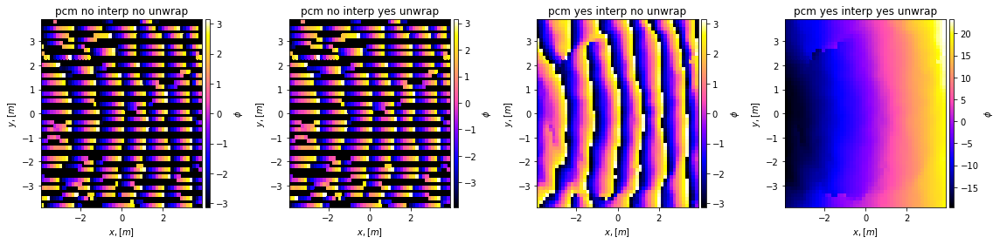

In [40]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
find=350
phi1NS=np.angle(NFNSbeam.V_LC_cross[:,:,find,0,0])
phiunwrapNS=unwrap2d(phi1NS,wrap_args=(False,True))
phi_iNS=NFNSbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrapNS=unwrap2d(phi_iNS,wrap_args=(False,True))

im1=ax1.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],phi1NS,cmap='gnuplot2')
im2=ax2.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],phiunwrapNS,cmap='gnuplot2')
im3=ax3.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],phi_iNS,cmap='gnuplot2')
im4=ax4.pcolormesh(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],phi_iunwrapNS,cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["pcm no interp no unwrap","pcm no interp yes unwrap","pcm yes interp no unwrap","pcm yes interp yes unwrap"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
# for ax in [ax2,ax5,ax6]:
#     ax.plot(range(-20,20),range(-20,20),'r-',linewidth=10)
tight_layout()


(A,B,C)=(36.364338,1.973444,0.000035)
G=0.000


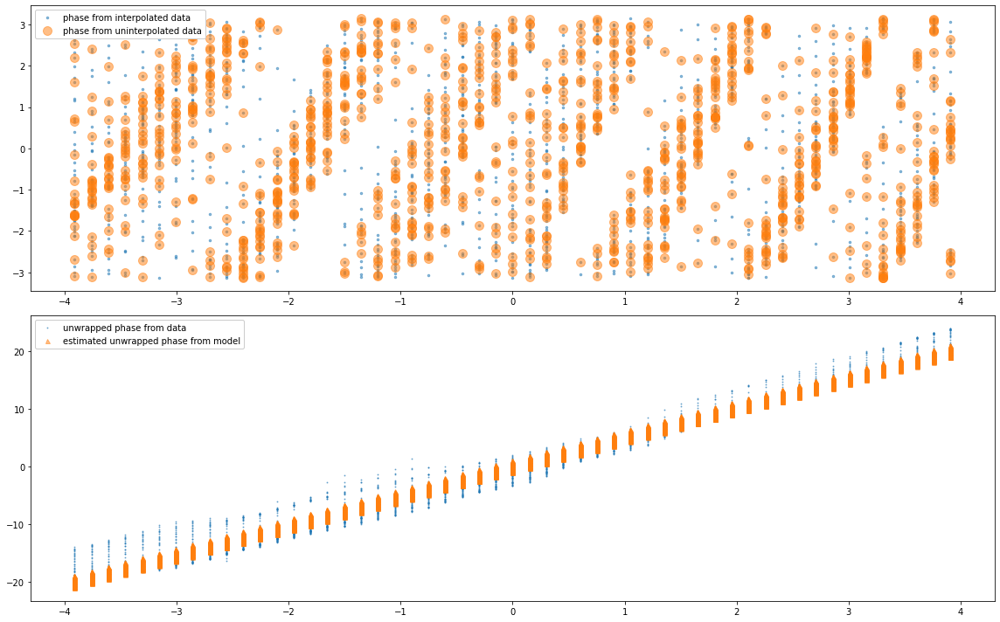

In [41]:
find=331
dxNS=NFNSbeam.d0_centers_grid[:,:,0]
dyNS=NFNSbeam.d1_centers_grid[:,:,0]
wlNS=(3.0e8/(NFNSbeam.freq[find]*1e6)) # keep this in m if you don't want everything to break!!
dcNS=(NFNSbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcabsNS=np.abs(NFNSbeam.V_LC_cross[:,:,find,0,0]).flatten()

phi1NS=np.angle(NFNSbeam.V_LC_cross[:,:,find,0,0])
phi1unwrapNS=unwrap2d(phi1NS)
phi_iNS=NFNSbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrapNS=unwrap2d(phi_iNS)

dcangNS=phi_iunwrapNS.flatten()

dcoordsNS=np.zeros((dxNS.shape[0]*dxNS.shape[1],3))
dcoordsNS[:,0]=dxNS.flatten()
dcoordsNS[:,1]=dyNS.flatten()
dcoordsNS[:,2]=(100*np.ones((dxNS.shape[0]*dxNS.shape[1]))).flatten()
unitvectsNS=dcoordsNS*np.outer(np.nansum((dcoordsNS)**2.0,axis=1)**-0.5,np.ones(3))


def Fringe_Fit(P,dronepos,V,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi-V

def Fringe(P,dronepos,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi

poptNS=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvectsNS[~np.isnan(dcangNS)],dcangNS[~np.isnan(dcangNS)],wlNS]).x
print("(A,B,C)=({:f},{:f},{:f})".format(poptNS[0],poptNS[1],poptNS[2]))
# print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(poptNS[3]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,10))
ax1.plot(dcoordsNS[:,0],phi_iNS.flatten(),'.',alpha=0.5,markersize=5,label='phase from interpolated data')
ax1.plot(dcoordsNS[:,0],phi1NS.flatten(),'.',alpha=0.5,markersize=20,label='phase from uninterpolated data')
ax1.legend(loc=2,framealpha=1)
ax2.plot(dcoordsNS[:,0],dcangNS,'.',alpha=0.5,markersize=2,label='unwrapped phase from data')
ax2.plot(dcoordsNS[:,0],Fringe(np.array(poptNS),unitvectsNS,wlNS),'^',alpha=0.5,markersize=5,label='estimated unwrapped phase from model')
ax2.legend(loc=2,framealpha=1)
tight_layout()

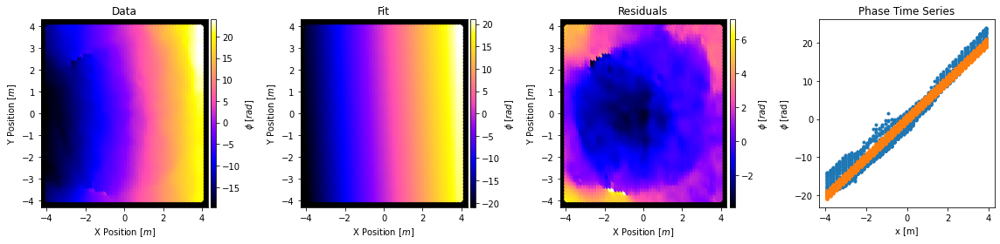

In [42]:
## Plot some stuff

fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dxNS,dyNS,s=50,c=dcangNS,cmap='gnuplot2')
im2=ax2.scatter(dxNS,dyNS,s=50,c=Fringe(poptNS,unitvectsNS,wlNS),cmap='gnuplot2')
im3=ax3.scatter(dxNS,dyNS,s=50,c=(dcangNS-Fringe(poptNS,unitvectsNS,wlNS)),cmap='gnuplot2')
ax4.plot(dcoordsNS[:,0],dcangNS,'.')
ax4.plot(dcoordsNS[:,0],Fringe(np.array(poptNS),unitvectsNS,wlNS),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


In [43]:
## Fitting loop for the fringing formula?

#stop

dxNS=NFNSbeam.d0_centers_grid[:,:,0]
dyNS=NFNSbeam.d1_centers_grid[:,:,0]
dcoordsNS=np.zeros((dxNS.shape[0]*dxNS.shape[1],3))
dcoordsNS[:,0]=dxNS.flatten()
dcoordsNS[:,1]=dyNS.flatten()
dcoordsNS[:,2]=(97*np.ones((dxNS.shape[0]*dxNS.shape[1]))).flatten()
unitvectsNS=dcoordsNS*np.outer(np.nansum((dcoordsNS)**2.0,axis=1)**-0.5,np.ones(3))

## I think this loop breaks when np.NaN occurs in the phi_i stage of the loop... going to check testbeam.beam_linear_interp_phase[:,:,find,0] for nan for each find...
fringepoptNS=np.NaN*np.ones((140,4))
fringedataNS=np.NaN*np.ones((53,53,140))
for k,find in enumerate(range(250,390)):
    print("{},{}".format(k,find),end='\r')
    wlNS=(3.0e8/(NFNSbeam.freq[find]/1e-6))
    dcNS=(NFNSbeam.V_LC_cross[:,:,find,0,0]).flatten()
    dcabsNS=np.abs(NFNSbeam.V_LC_cross[:,:,find,0,0]).flatten()
    phi_iNS=NFNSbeam.beam_linear_interp_phase[:,:,find,0]
    if True in np.isnan(NFNSbeam.beam_linear_interp_phase[:,:,find,0]):
        print('true, breaking loop to skip index {}'.format(k))
    else:
        phi_iunwrapNS=unwrap2d(phi_iNS,wrap_args=(False,True))
        dcangNS=phi_iunwrapNS.flatten()
        fringedataNS[:,:,k]=phi_iunwrapNS
        poptNS=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvectsNS[~np.isnan(dcangNS)],dcangNS[~np.isnan(dcangNS)],wlNS]).x
        fringepoptNS[k,:]=poptNS

true, breaking loop to skip index 58
true, breaking loop to skip index 72
true, breaking loop to skip index 74
true, breaking loop to skip index 75


MovieWriter ffmpeg unavailable; using Pillow instead.


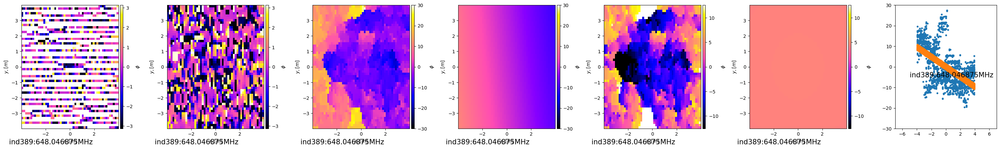

In [22]:
## Make the gif:
## can skip if annoying!

from matplotlib.animation import FuncAnimation
fig,[ax1,ax2,ax3,ax4,ax5,ax6,ax7]=subplots(nrows=1,ncols=7,figsize=(30,4.5))
cax1 = ax1.pcolormesh(dx, dy, np.angle(testbeam.V_LC_cross[:,:,250,0,0]), vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax2 = ax2.pcolormesh(dx, dy, testbeam.beam_linear_interp_phase[:,:,250,0], vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax3 = ax3.pcolormesh(dx, dy, fringedata[:,:,0], vmin=-30, vmax=30, cmap='gnuplot2')
cax4 = ax4.pcolormesh(dx, dy, Fringe(fringepopt[0,:],unitvects,wl).reshape(dx.shape), vmin=-30, vmax=30, cmap='gnuplot2')
cax5 = ax5.pcolormesh(dx, dy, fringedata[:,:,0]-Fringe(fringepopt[0,:],unitvects,wl).reshape(dx.shape), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')
cax6 = ax6.pcolormesh(dx, dy, (-2*(3e8/(testbeam.freq[250]*1e6))*np.sqrt((dx**2.0)+(dy**2.0)+(97.0**2.0)))%(2.0*np.pi), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')

images=[cax1,cax2,cax3,cax4,cax5,cax6]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$"]

for j,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    #ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
    
txt1=ax1.text(-5,-5, "", fontsize=15)
txt2=ax2.text(-5,-5, "", fontsize=15)
txt3=ax3.text(-5,-5, "", fontsize=15)
txt4=ax4.text(-5,-5, "", fontsize=15)
txt5=ax5.text(-5,-5, "", fontsize=15)
txt6=ax6.text(-5,-5, "", fontsize=15)
tight_layout()


def animate(vvv):
    cax1.set_array(np.angle(testbeam.V_LC_cross[:,:,250+vvv,0,0]))
    cax2.set_array(testbeam.beam_linear_interp_phase[:,:,250+vvv,0])
    cax3.set_array(fringedata[:,:,vvv])
    cax4.set_array(Fringe(fringepopt[vvv],unitvects,wl).reshape(dx.shape))
    cax5.set_array(fringedata[:,:,vvv]-Fringe(fringepopt[vvv],unitvects,wl).reshape(dx.shape))
    cax6.set_array((-2*(3e8/(testbeam.freq[vvv+250]*1e6))*np.sqrt((dx**2.0)+(dy**2.0)+(97.0**2.0)))%(2.0*np.pi))
    
    ax7.clear()
    ax7.plot(dcoords[:,0],fringedata[:,:,vvv].flatten(),'.')
    ax7.plot(dcoords[:,0],Fringe(np.array(fringepopt[vvv,:]),unitvects,(3.0e8/(testbeam.freq[vvv+250]/1e-6))).flatten(),'.')
    ax7.set_xlim(-7,7)
    ax7.set_ylim(-30,30)
    txt7=ax7.text(-5,-5, "", fontsize=15)
    
    txt1.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt2.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt3.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt4.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt5.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt6.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt7.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    print("{}".format(vvv),end='\r')

anim = FuncAnimation(fig, animate, interval=300, frames=140)
anim.save('../../Desktop/NFphase0308.gif')
show()

<ipython-input-44-732d3ebede90>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
<ipython-input-44-732d3ebede90>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')


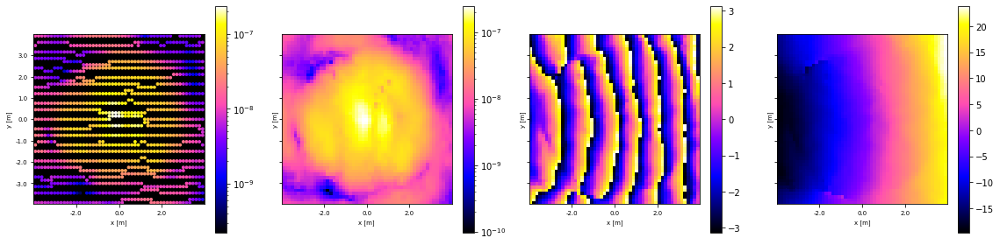

In [44]:
NFNSbeam.beam_linear_interp_phase_unwrapped.shape

fig,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4),sharex=True,sharey=True)
ax1.set_facecolor('k')
find=331
pcm1=ax1.scatter(NFNSbeam.d0_centers_grid[:,:,0],NFNSbeam.d1_centers_grid[:,:,0],c=np.abs(NFNSbeam.V_LC_cross[:,:,find,0,0]),cmap='gnuplot2',s=8,norm=LogNorm())
#ax1.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],(testbeam.V_LC_mean[:,:,find,0,0]),cmap='gnuplot2',norm=LogNorm())
pcm2=ax2.pcolormesh(NFNSbeam.d0_edges_grid[:,:,0],NFNSbeam.d1_edges_grid[:,:,0],(NFNSbeam.beam_linear_interp_amp[:,:,find,0]),cmap='gnuplot2',norm=LogNorm())
ax1.set_xlim(ax2.get_xlim())
ax1.set_ylim(ax2.get_ylim())
pcm3=ax3.pcolormesh(NFNSbeam.d0_edges_grid[:,:,0],NFNSbeam.d1_edges_grid[:,:,0],NFNSbeam.beam_linear_interp_phase[:,:,find,0],cmap='gnuplot2')
pcm4=ax4.pcolormesh(NFNSbeam.d0_edges_grid[:,:,0],NFNSbeam.d1_edges_grid[:,:,0],fringedataNS[:,:,find-250],cmap='gnuplot2')
pcms=[pcm1,pcm2,pcm3,pcm4]

for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('x [m]',fontsize='x-small')
    ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
    #ax.set_xticks([])
    ax.set_ylabel('y [m]',fontsize='x-small')
    ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')
    #ax.set_yticks([])
    ax.set(aspect='equal')
    colorbar(mappable=pcms[i],ax=ax)


tight_layout()


In [47]:
##  NF2FF Instructions
##  1. Preparation and Preliminary Measurements
##  2. Design a Flightpath optimized for NF Sampling 
##  3. Execute testflights and collect data
##  4. Analyze data using the Drone, Corr, and Concat Classes
##  5. Produce yaml, gfit, and pickle files of reduced data
##  6. Initialize the beammap class for each flight using the 0x1 (cross) data
##  7. Interpolate beammap data so that every cell contains data
##  8. Trim the interpolated beammap so that no nans are present
##  9. Execute the unwrap function on the interpolated data to unwrap the phase
## 10. Perform fit on the wrapped/unwrapped phase measurements
## 11. Subtract best-fit geometric phase from the unwrapped phase to obtain residual AUT phase
## 12. Reconstruct E-Field from AUT by complexifying the sqrt(auto=0x0) with the residual AUT phase

find=331
wlNS=(3.0e10/(NFNSbeam.freq[find]/1e-6)) # this is in cm!!
zez=find-250
amplNS=NFNSbeam.V_LC_mean[:,:,250+zez,1,0]
nanmaskNS=amplNS/amplNS
phaseNS=fringedataNS[:,:,zez]-Fringe(fringepoptNS[zez],dcoordsNS,wlNS).reshape(dxNS.shape)
phasefactorNS=np.e**(1.0j*phaseNS)
phaseNS_masked = nanmaskNS*phaseNS
phasefactorNS_masked = np.exp(1.0j*phaseNS_masked)
# cplxEfieldNS=amplNS*phasefactorNS
cplxEfieldNS=amplNS*phasefactorNS_masked



<ipython-input-48-b8348fc0df6e>:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im1=ax1.pcolormesh(dxNS, dyNS, NFNSbeam.beam_linear_interp_amp[:,:,250+zez,0], cmap='gnuplot2')
<ipython-input-48-b8348fc0df6e>:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im2=ax2.pcolormesh(dxNS, dyNS, phaseNS, cmap='gnuplot2')
<ipython-input-48-b8348fc0df6e>:7: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.

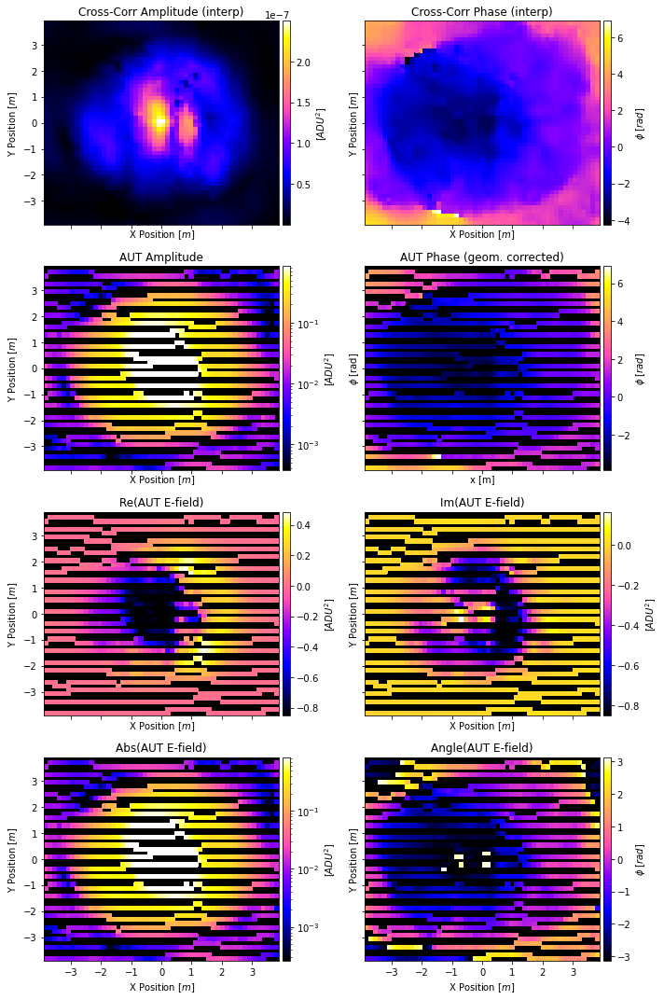

In [48]:
fig,[[ax1,ax2],[ax3,ax4],[ax5,ax6],[ax7,ax8]]=subplots(nrows=4,ncols=2,figsize=(10,15),sharex=True,sharey=True)


im1=ax1.pcolormesh(dxNS, dyNS, NFNSbeam.beam_linear_interp_amp[:,:,250+zez,0], cmap='gnuplot2')
# im2=ax2.pcolormesh(dxNS, dyNS, phaseNS, cmap='gnuplot2')
im2=ax2.pcolormesh(dxNS, dyNS, phaseNS, cmap='gnuplot2')
im3=ax3.pcolormesh(dxNS, dyNS, amplNS, norm=LogNorm(), cmap='gnuplot2')
im4=ax4.pcolormesh(dxNS, dyNS, nanmaskNS*phaseNS, cmap='gnuplot2')
im5=ax5.pcolormesh(dxNS, dyNS, np.real(cplxEfieldNS), cmap='gnuplot2')
im6=ax6.pcolormesh(dxNS, dyNS, np.imag(cplxEfieldNS), cmap='gnuplot2')
im7=ax7.pcolormesh(dxNS, dyNS, np.abs(cplxEfieldNS), cmap = 'gnuplot2', norm=LogNorm())
im8=ax8.pcolormesh(dxNS, dyNS, np.angle(cplxEfieldNS), cmap = 'gnuplot2')



images=[im1,im2,im3,im4,im5,im6,im7,im8]
cbars=['[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','[$ADU^2$]','[$ADU^2$]','$\phi$ [$rad$]']
titles=["Cross-Corr Amplitude (interp)","Cross-Corr Phase (interp)","AUT Amplitude","AUT Phase (geom. corrected)","Re(AUT E-field)","Im(AUT E-field)","Abs(AUT E-field)","Angle(AUT E-field)"]
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()

In [6]:
## To prepare data for the NF2FF code, we need to determine the electric field in both polarizations:
## NF File 1: ch0=Bicolog, ch1=Telescope_Y_NSpol --> ## 'FLY781.csv' - Altitude ~18m, Yaw ~0deg --> NFNS18
## NF File 2: ch0=Telescope_X_EWpol, ch1=Bicolog
    ## 'FLY782.csv' - Altitude ~18m, Yaw ~90deg  --> NFEW18
    ## 'FLY783.csv' - Altitude ~20m, Yaw ~90deg  --> NFEW20 

start of concat loop is: 2024-06-07 09:15:40.729147


/home/am3674/anaconda3/lib/python3.8/site-packages/beamcals/beammap.py:306: RuntimeWarning: divide by zero encountered in reciprocal
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/am3674/anaconda3/lib/python3.8/site-packages/beamcals/beammap.py:306: RuntimeWarning: invalid value encountered in multiply
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/am3674/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:229: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


/home/am3674/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:211: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


end of concat loop is: 2024-06-07 09:19:17.98841924,           


/home/am3674/anaconda3/lib/python3.8/site-packages/beamcals/beammap.py:367: RuntimeWarning: Mean of empty slice
  self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)


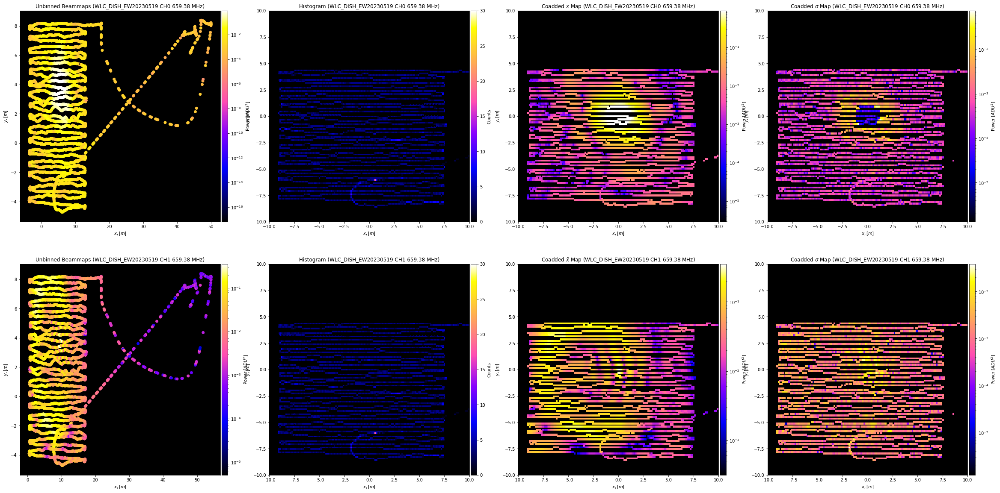

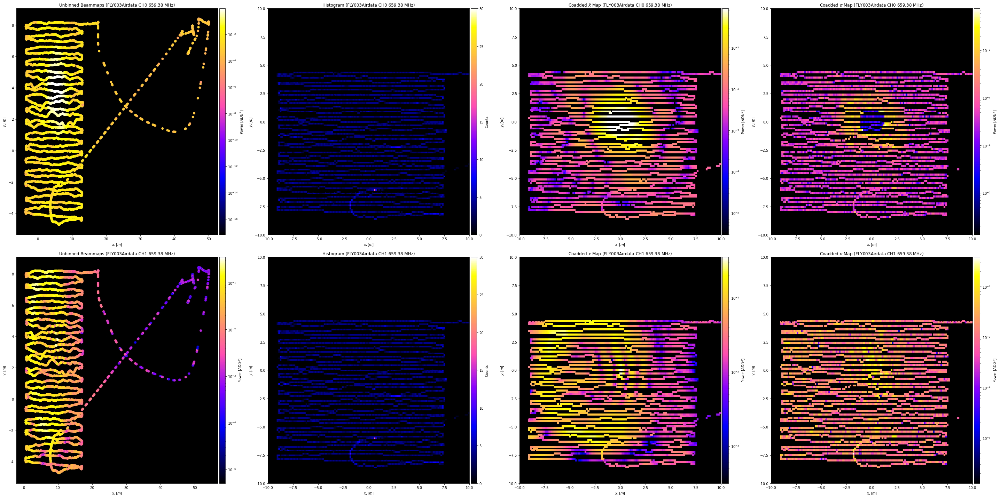

In [7]:
## NF File 2: ch0=Telescope_X_EWpol, ch1=Bicolog
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-18,16,0.45],Yargs=[-17,18,0.45],f_index=340,normalization='Gauss',operation='coadd',
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-20,20,0.225],Yargs=[-20,20,0.225],f_index=340,normalization='Gauss',operation='coadd',
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-16,16,0.45],Yargs=[-16,16,0.45],f_index=340,normalization='Gauss',operation='coadd',
NFEWbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],d0args=[-10,10,0.15],d1args=[-10,10,0.15],f_index_cc=360,normalization='Gauss',operation='coadd',
                         pickle_directory="/hirax/20240308_WLC_NFandFF/products/pickles/",\
                         gfit_directory="/hirax/20240308_WLC_NFandFF/products/gfits/",\
                         flightmasterpath="20240308_WLC_flights_forscripts.yaml",vplot=True,include_cross_data=True)

#export pickle for reduced class data for beammap function (include_cross_data=True will save V_cross_bgsub):
# thingy = rc.Smallify_comap(beamclass=testbeam,pickle_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/beam_pickles/",include_cross_data=True)
# print(thingy.tmppath)
# with open(thingy.tmppath, 'wb') as outp:
#     pickle.dump(thingy, outp, pickle.HIGHEST_PROTOCOL)
# print('DONE')

In [8]:
NFEWbeam.complex_interpolation(d0_interp=NFEWbeam.d0_centers[:,0], d1_interp=NFEWbeam.d1_centers[:,0],method='cubic',variogram_model='spherical',outputs=False,Fargs=[340,340])

/home/am3674/anaconda3/lib/python3.8/site-packages/numpy/lib/function_base.py:1540: RuntimeWarning: invalid value encountered in remainder
  ddmod = mod(dd + pi, 2*pi) - pi


<ipython-input-9-357644bb4e97>:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax1.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],NFEWbeam.V_LC_cross.real[:,:,find,0,0])
<ipython-input-9-357644bb4e97>:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax2.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],NFEWbeam.V_LC_cross.imag[:,:,find,0,0])
<ipython-input-9-357644bb4e97>:7: MatplotlibDeprecationWarning: 

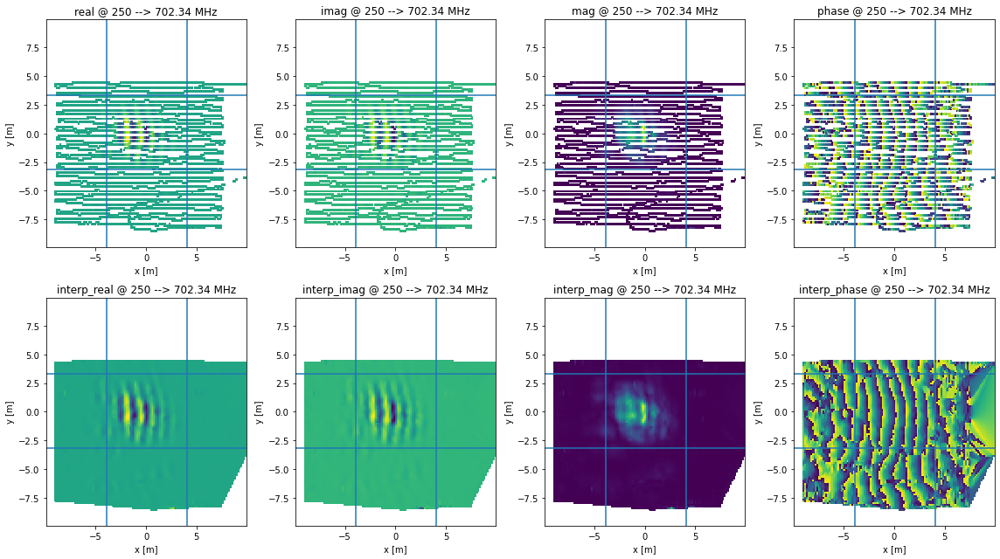

In [9]:
## plot the results of the interpolation and find where to cut to eliminate NAN values:

fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,9))
find=250
ax1.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],NFEWbeam.V_LC_cross.real[:,:,find,0,0])
ax2.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],NFEWbeam.V_LC_cross.imag[:,:,find,0,0])
ax3.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],np.abs(NFEWbeam.V_LC_cross)[:,:,find,0,0])#,norm=LogNorm())
ax4.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],np.angle(NFEWbeam.V_LC_cross)[:,:,find,0,0])

ax5.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],NFEWbeam.beam_linear_interp.real[:,:,find,0])
ax6.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],NFEWbeam.beam_linear_interp.imag[:,:,find,0])
ax7.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],NFEWbeam.beam_linear_interp_amp[:,:,find,0])#,norm=LogNorm())
ax8.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],NFEWbeam.beam_linear_interp_phase[:,:,find,0])

titles=['real','imag','mag','phase','interp_real','interp_imag','interp_mag','interp_phase']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i]+' @ {} --> {:.2f} MHz'.format(find,NFEWbeam.freq[find]))
    ax.set_xlabel('x [m]')
    ax.set_ylabel('y [m]')
    ax.axvline(NFEWbeam.d0_centers_grid[40,0,0])
    ax.axhline(NFEWbeam.d1_centers_grid[0,45,0])
    ax.axvline(NFEWbeam.d0_centers_grid[-40,0,0])
    ax.axhline(NFEWbeam.d1_centers_grid[0,-45,0])
tight_layout()

In [10]:
NFEWbeam.beam_linear_interp_amp.shape

(133, 133, 1024, 1)

In [11]:
# cropping to a square and removing NaNs
# stop
xmin,xmax,ymin,ymax=[40,-40,45,-35]
NFEWbeam.beam_linear_interp=NFEWbeam.beam_linear_interp[xmin:xmax,ymin:ymax]
NFEWbeam.beam_linear_interp_amp=NFEWbeam.beam_linear_interp_amp[xmin:xmax,ymin:ymax]
NFEWbeam.beam_linear_interp_phase=NFEWbeam.beam_linear_interp_phase[xmin:xmax,ymin:ymax]
NFEWbeam.beam_linear_interp_phase_unwrapped=NFEWbeam.beam_linear_interp_phase_unwrapped[xmin:xmax,ymin:ymax]
NFEWbeam.histogram_LC=NFEWbeam.histogram_LC[xmin:xmax,ymin:ymax]
NFEWbeam.V_LC_cross=NFEWbeam.V_LC_cross[xmin:xmax,ymin:ymax]
NFEWbeam.V_LC_mean=NFEWbeam.V_LC_mean[xmin:xmax,ymin:ymax]
NFEWbeam.V_LC_operation=NFEWbeam.V_LC_operation[xmin:xmax,ymin:ymax]
NFEWbeam.V_LC_std=NFEWbeam.V_LC_std[xmin:xmax,ymin:ymax]
NFEWbeam.d0_centers_grid=NFEWbeam.d0_centers_grid[xmin:xmax,ymin:ymax]
NFEWbeam.d0_edges_grid=NFEWbeam.d0_edges_grid[xmin:xmax,ymin:ymax]
NFEWbeam.d1_centers_grid=NFEWbeam.d1_centers_grid[xmin:xmax,ymin:ymax]
NFEWbeam.d1_edges_grid=NFEWbeam.d1_edges_grid[xmin:xmax,ymin:ymax]
    
    
NFEWbeam.d0_centers=NFEWbeam.d0_centers[xmin:xmax]
NFEWbeam.d0_edges=NFEWbeam.d0_edges[xmin:xmax]
NFEWbeam.d1_centers=NFEWbeam.d1_centers[ymin:ymax]
NFEWbeam.d1_edges=NFEWbeam.d1_edges[ymin:ymax]

In [12]:
NFEWbeam.beam_linear_interp_amp.shape

(53, 53, 1024, 1)

<ipython-input-13-f9908291a3f0>:8: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im1=ax1.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],phi1,cmap='gnuplot2')
<ipython-input-13-f9908291a3f0>:9: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im2=ax2.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],phiunwrap,cmap='gnuplot2')
<ipython-input-13-f9908291a3f0>:10: MatplotlibDeprecationWarning: shading='flat' when

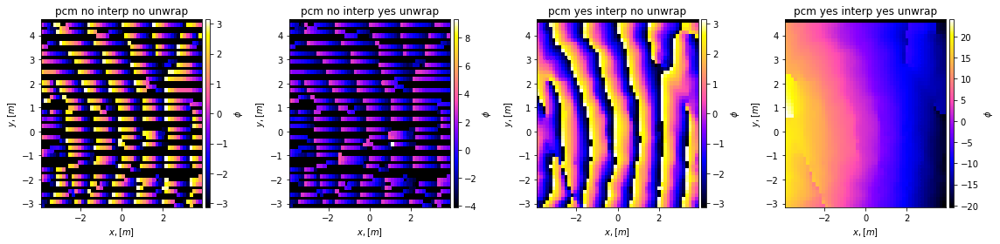

In [13]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
find=350
phi1=np.angle(NFEWbeam.V_LC_cross[:,:,find,0,0])
phiunwrap=unwrap2d(phi1,wrap_args=(False,True))
phi_i=NFEWbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i,wrap_args=(False,True))

im1=ax1.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],phi1,cmap='gnuplot2')
im2=ax2.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],phiunwrap,cmap='gnuplot2')
im3=ax3.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],phi_i,cmap='gnuplot2')
im4=ax4.pcolormesh(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],phi_iunwrap,cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["pcm no interp no unwrap","pcm no interp yes unwrap","pcm yes interp no unwrap","pcm yes interp yes unwrap"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
# for ax in [ax2,ax5,ax6]:
#     ax.plot(range(-20,20),range(-20,20),'r-',linewidth=10)
tight_layout()


(A,B,C)=(-32.871212,-2.519489,0.022617)
G=0.000


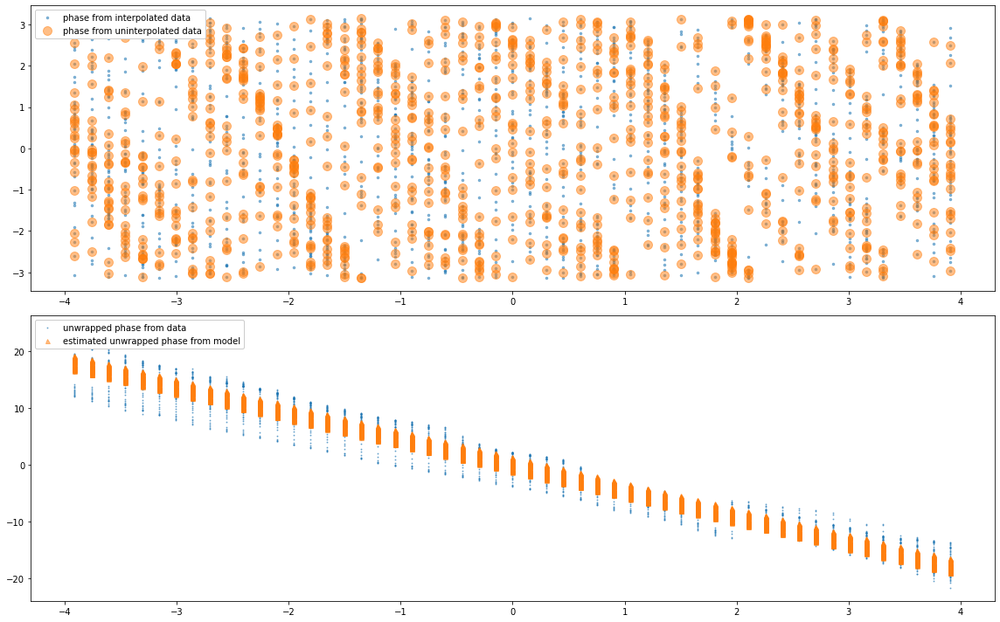

In [14]:
find=350
dx=NFEWbeam.d0_centers_grid[:,:,0]
dy=NFEWbeam.d1_centers_grid[:,:,1]
wl=(3.0e8/(NFEWbeam.freq[find]/1e-6))
dc=(NFEWbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcabs=np.abs(NFEWbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcang=phi_iunwrap.flatten()

phi1=np.angle(NFEWbeam.V_LC_cross[:,:,find,0,0])
phi1unwrap=unwrap2d(phi1)
phi_i=NFEWbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i)

dcang=phi_iunwrap.flatten()

dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(100*np.ones((dx.shape[0]*dx.shape[1]))).flatten()
unitvects=dcoords*np.outer(np.nansum((dcoords)**2.0,axis=1)**-0.5,np.ones(3))


def Fringe_Fit(P,dronepos,V,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi-V

def Fringe(P,dronepos,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi

popt=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvects[~np.isnan(dcang)],dcang[~np.isnan(dcang)],wl]).x
print("(A,B,C)=({:f},{:f},{:f})".format(popt[0],popt[1],popt[2]))
# print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[3]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,10))
ax1.plot(dcoords[:,0],phi_i.flatten(),'.',alpha=0.5,markersize=5,label='phase from interpolated data')
ax1.plot(dcoords[:,0],phi1.flatten(),'.',alpha=0.5,markersize=20,label='phase from uninterpolated data')
ax1.legend(loc=2,framealpha=1)
ax2.plot(dcoords[:,0],dcang,'.',alpha=0.5,markersize=2,label='unwrapped phase from data')
ax2.plot(dcoords[:,0],Fringe(np.array(popt),unitvects,wl),'^',alpha=0.5,markersize=5,label='estimated unwrapped phase from model')
ax2.legend(loc=2,framealpha=1)
tight_layout()


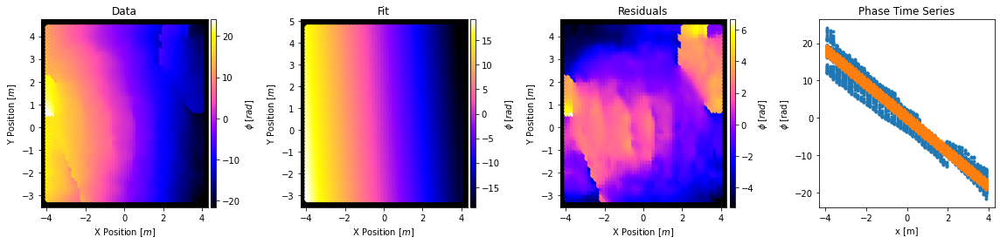

In [15]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im2=ax2.scatter(dx,dy,s=50,c=Fringe(popt,unitvects,wl),cmap='gnuplot2')
im3=ax3.scatter(dx,dy,s=50,c=(dcang-Fringe(popt,unitvects,wl)),cmap='gnuplot2')
ax4.plot(dcoords[:,0],dcang,'.')
ax4.plot(dcoords[:,0],Fringe(np.array(popt),unitvects,wl),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


In [16]:
dx=NFEWbeam.d0_centers_grid[:,:,0]
dy=NFEWbeam.d1_centers_grid[:,:,0]
dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(97*np.ones((dx.shape[0]*dx.shape[1]))).flatten()
unitvects=dcoords*np.outer(np.nansum((dcoords)**2.0,axis=1)**-0.5,np.ones(3))

## I think this loop breaks when np.NaN occurs in the phi_i stage of the loop... going to check testbeam.beam_linear_interp_phase[:,:,find,0] for nan for each find...
fringepopt=np.NaN*np.ones((140,4))
fringedata=np.NaN*np.ones((53,53,140))
for k,find in enumerate(range(250,390)):
    print("{},{}".format(k,find),end='\r')
    wl=(3.0e8/(NFEWbeam.freq[find]/1e-6))
    dc=(NFEWbeam.V_LC_cross[:,:,find,0,0]).flatten()
    dcabs=np.abs(NFEWbeam.V_LC_cross[:,:,find,0,0]).flatten()
    phi_i=NFEWbeam.beam_linear_interp_phase[:,:,find,0]
#     if True in np.isnan(testbeam.beam_linear_interp_phase[:,:,find,0]):
#         print('true, breaking loop to skip index {}'.format(k))
#     else:
    phi_iunwrap=unwrap2d(phi_i,wrap_args=(False,True))
    dcang=phi_iunwrap.flatten()
    fringedata[:,:,k]=phi_iunwrap
    popt=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvects[~np.isnan(dcang)],dcang[~np.isnan(dcang)],wl]).x
    fringepopt[k,:]=popt    

<ipython-input-15-9da5a052bcdb>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  cax1 = ax1.pcolormesh(dx, dy, np.angle(NFEWbeam.V_LC_cross[:,:,250,0,0]), vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
<ipython-input-15-9da5a052bcdb>:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  cax2 = ax2.pcolormesh(dx, dy, NFEWbeam.beam_linear_interp_phase[:,:,250,0], vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
<ipython-input-15-9da5a052bcdb>:5: MatplotlibDeprecationWarnin

TypeError: Fringe() missing 1 required positional argument: 'wavelengthm'

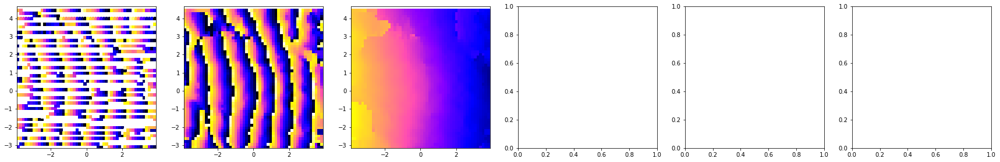

In [15]:
# making the gif
from matplotlib.animation import FuncAnimation
fig,[ax1,ax2,ax3,ax4,ax5,ax6]=subplots(nrows=1,ncols=6,figsize=(30,4.5))
cax1 = ax1.pcolormesh(dx, dy, np.angle(NFEWbeam.V_LC_cross[:,:,250,0,0]), vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax2 = ax2.pcolormesh(dx, dy, NFEWbeam.beam_linear_interp_phase[:,:,250,0], vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax3 = ax3.pcolormesh(dx, dy, fringedata[:,:,0], vmin=-30, vmax=30, cmap='gnuplot2')
cax4 = ax4.pcolormesh(dx, dy, Fringe(fringepopt[0,:],dcoords).reshape(dx.shape), vmin=-30, vmax=30, cmap='gnuplot2')
cax5 = ax5.pcolormesh(dx, dy, fringedata[:,:,0]-Fringe(fringepopt[0,:],dcoords).reshape(dx.shape), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')

images=[cax1,cax2,cax3,cax4,cax5]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$","$\phi$"]

for j,ax in enumerate([ax1,ax2,ax3,ax4,ax5]):
    #ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
    
# fig.colorbar(cax1)
# fig.colorbar(cax2)
# fig.colorbar(cax3)
# fig.colorbar(cax4)
txt1=ax1.text(-10,-10, "", fontsize=15)
txt2=ax2.text(-10,-10, "", fontsize=15)
txt3=ax3.text(-10,-10, "", fontsize=15)
txt4=ax4.text(-10,-10, "", fontsize=15)
txt5=ax5.text(-10,-10, "", fontsize=15)
tight_layout()


def animate(vvv):
    cax1.set_array(np.angle(testbeam.V_LC_cross[:,:,250+vvv,0,0]))
    cax2.set_array(testbeam.beam_linear_interp_phase[:,:,250+vvv,0])
    cax3.set_array(fringedata[:,:,vvv])
    cax4.set_array(Fringe(fringepopt[vvv],dcoords).reshape(dx.shape))
    cax5.set_array(fringedata[:,:,vvv]-Fringe(fringepopt[vvv],dcoords).reshape(dx.shape))
    
    ax6.clear()
    ax6.plot(dcoords[:,0],fringedata[:,:,vvv].flatten(),'.')
    ax6.plot(dcoords[:,0],Fringe(np.array(fringepopt[vvv,:]),dcoords).flatten(),'.')
    ax6.set_xlim(-15,15)
    ax6.set_ylim(-15,15)
    txt6=ax6.text(-10,-10, "", fontsize=15)
    
    txt1.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt2.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt3.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt4.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt5.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt6.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    print("{}".format(vvv),end='\r')

anim = FuncAnimation(fig, animate, interval=100, frames=140)
anim.save('../../Desktop/NFphaseEW.gif')
show()

<ipython-input-17-a0da07fdba05>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
<ipython-input-17-a0da07fdba05>:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')


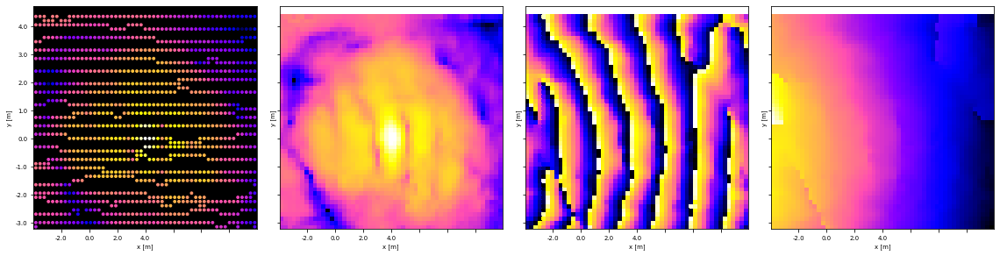

In [17]:
NFEWbeam.beam_linear_interp_phase_unwrapped.shape

fig,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4),sharex=True,sharey=True)
ax1.set_facecolor('k')
find=350
ax1.scatter(NFEWbeam.d0_centers_grid[:,:,0],NFEWbeam.d1_centers_grid[:,:,0],c=np.abs(NFEWbeam.V_LC_cross[:,:,find,0,0]),cmap='gnuplot2',s=8,norm=LogNorm())
#ax1.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],(testbeam.V_LC_mean[:,:,find,0,0]),cmap='gnuplot2',norm=LogNorm())
ax2.pcolormesh(NFEWbeam.d0_edges_grid[:,:,0],NFEWbeam.d1_edges_grid[:,:,0],(NFEWbeam.beam_linear_interp_amp[:,:,find,0]),cmap='gnuplot2',norm=LogNorm())
ax1.set_xlim(ax2.get_xlim())
ax1.set_ylim(ax2.get_ylim())
ax3.pcolormesh(NFEWbeam.d0_edges_grid[:,:,0],NFEWbeam.d1_edges_grid[:,:,0],NFEWbeam.beam_linear_interp_phase[:,:,find,0],cmap='gnuplot2')
ax4.pcolormesh(NFEWbeam.d0_edges_grid[:,:,0],NFEWbeam.d1_edges_grid[:,:,0],fringedata[:,:,find-250],cmap='gnuplot2')

for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('x [m]',fontsize='x-small')
    ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
    #ax.set_xticks([])
    ax.set_ylabel('y [m]',fontsize='x-small')
    ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')
    #ax.set_yticks([])
    ax.set(aspect='equal')


tight_layout()


<ipython-input-18-72287facf0ab>:13: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im1=ax1.pcolormesh(dx, dy, NFEWbeam.beam_linear_interp_amp[:,:,250+zez,0], cmap='gnuplot2')
<ipython-input-18-72287facf0ab>:14: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im2=ax2.pcolormesh(dx, dy, phase, cmap='gnuplot2')
<ipython-input-18-72287facf0ab>:15: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Eithe

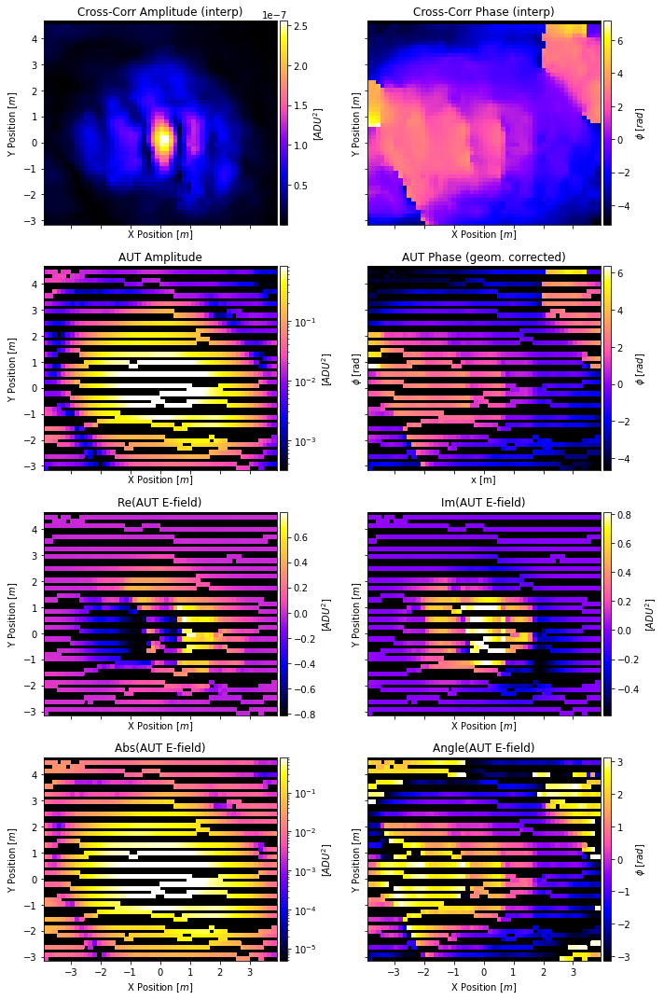

In [18]:
# making the complex E-fields to export to the npz
find=350
wl=(3.0e10/(NFEWbeam.freq[find]/1e-6))
fig,[[ax1,ax2],[ax3,ax4],[ax5,ax6],[ax7,ax8]]=subplots(nrows=4,ncols=2,figsize=(10,15),sharex=True,sharey=True)
zez=100
# zez=0
ampl=NFEWbeam.V_LC_mean[:,:,250+zez,0,0]
nanmask=ampl/ampl
phase=fringedata[:,:,zez]-Fringe(fringepopt[zez],dcoords,wl).reshape(dx.shape)
phasefactor=np.e**(1.0j*phase)
cplxEfieldEW=ampl*phasefactor

im1=ax1.pcolormesh(dx, dy, NFEWbeam.beam_linear_interp_amp[:,:,250+zez,0], cmap='gnuplot2')
im2=ax2.pcolormesh(dx, dy, phase, cmap='gnuplot2')
im3=ax3.pcolormesh(dx, dy, ampl, norm=LogNorm(), cmap='gnuplot2')
im4=ax4.pcolormesh(dx, dy, nanmask*phase, cmap='gnuplot2')
im5=ax5.pcolormesh(dx, dy, np.real(cplxEfieldEW), cmap='gnuplot2')
im6=ax6.pcolormesh(dx, dy, np.imag(cplxEfieldEW), cmap='gnuplot2')
im7=ax7.pcolormesh(dx, dy, np.abs(cplxEfieldEW),cmap='gnuplot2', norm=LogNorm())
im8=ax8.pcolormesh(dx, dy, np.angle(cplxEfieldEW), cmap='gnuplot2')

images=[im1,im2,im3,im4,im5,im6,im7,im8]
cbars=['[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','[$ADU^2$]','[$ADU^2$]','$\phi$ [$rad$]']
titles=["Cross-Corr Amplitude (interp)","Cross-Corr Phase (interp)","AUT Amplitude","AUT Phase (geom. corrected)","Re(AUT E-field)","Im(AUT E-field)","Abs(AUT E-field)","Angle(AUT E-field)"]
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


In [19]:
NFEWbeam.freq[350]

663.28125

### Exporting the fields into an npz file

Comment out `stop` below when you actually want to do it, and change to the directory you want.
This only exports the NFs, you would have to add the FF to np.savez below if you want it.

<ipython-input-20-1a9d2893a293>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax1.pcolormesh(dx,dy,np.abs(cplxEfieldEW))


NameError: name 'cplxEfieldNS' is not defined

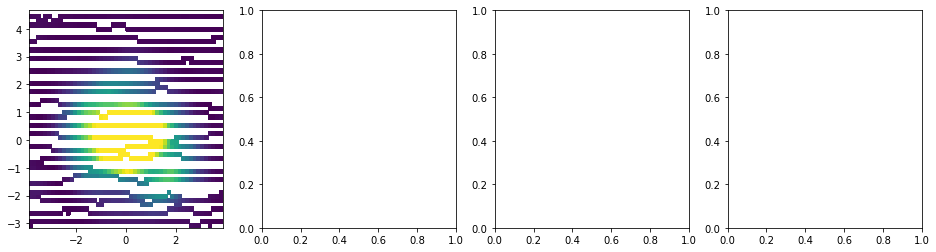

In [20]:
stop
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
ax1.pcolormesh(dx,dy,np.abs(cplxEfieldEW))
ax2.pcolormesh(dx,dy,np.abs(cplxEfieldNS))

# np.savez("/home/tyndall/Desktop/f354cplxEfield.npz",cplxEfieldEW=cplxEfieldEW,cplxEfieldNS=cplxEfieldNS)
np.savez("cplxEfield_24042024.npz",cplxEfieldNS=cplxEfieldNS,cplxEfieldEW=cplxEfieldEW)


In [228]:
dat=np.load("/home/tyndall/Desktop/f354cplxEfield.npz")
for key in dat.keys():
    print(key)
dat['cplxEfieldEW']
dat['cplxEfieldNS']

cplxEfieldEW
cplxEfieldNS


(86, 86)

In [229]:
testbeam.freq[354]

661.71875

In [ ]:
STOP

start of big ass loop is: 2024-01-23 14:28:09.963673


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:250: RuntimeWarning: divide by zero encountered in reciprocal
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:250: RuntimeWarning: invalid value encountered in multiply
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/scipy/stats/_binned_statistic.py:594: RuntimeWarning: invalid value encountered in subtract
  delta = values[vv] - flatsum[binnumbers] / flatcount[binnumbers]


end of chan/freq loop is: 2024-01-23 14:28:25.538382           


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:329: RuntimeWarning: Mean of empty slice
  self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:342: RuntimeWarning: Mean of empty slice
  im4=ax4.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],np.nanmean(self.V_LC_std[:,:,find,i,:],axis=2),cmap=cm.gnuplot2,norm=LogNorm())


/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/beam_pickles/FLY781_20230519T190815Z_ver_20240123T142826beam_concat.pkl
DONE


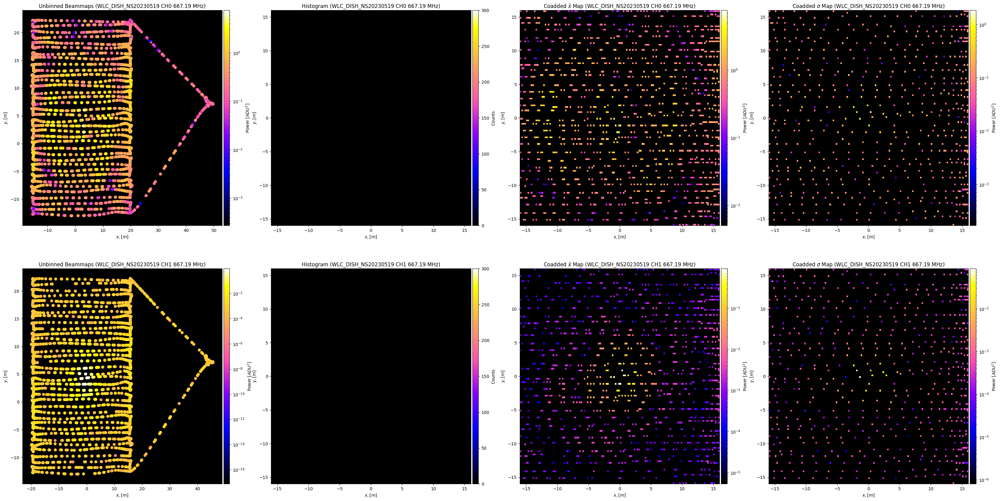

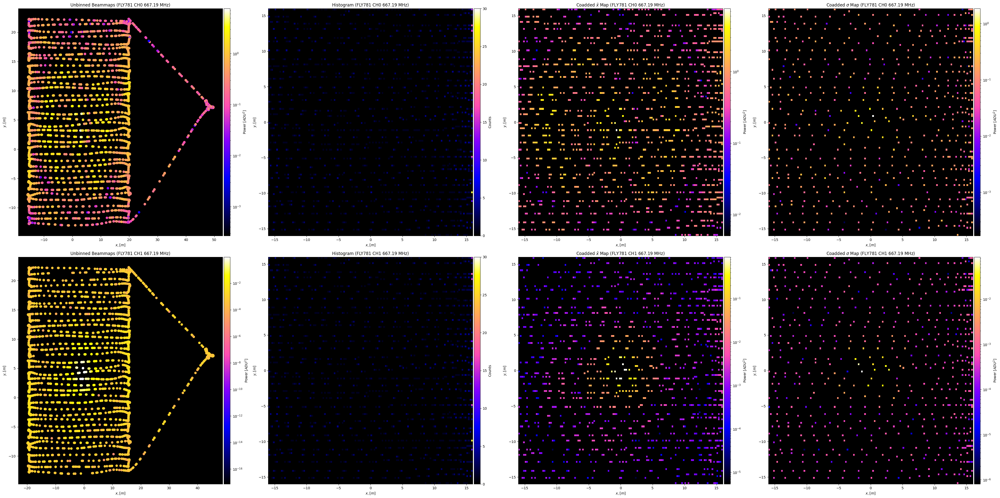

In [28]:
#NF
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-18,16,0.5],Yargs=[-17,18,0.5],f_index=340,normalization='Gauss',operation='coadd',
testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-16,16,0.25],Yargs=[-16,16,0.25],f_index=340,normalization='Gauss',operation='coadd',
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-20,20,0.225],Yargs=[-20,20,0.225],f_index=340,normalization='Gauss',operation='coadd',
                         pickle_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/pickles/",\
                         gfit_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/gfits/",\
                         flightmasterpath="/home/tyndall/python/beamcals_venv/newburghlabdrone/analysis/WLC_flights_forscripts.yaml",vplot=True,include_cross_data=True)

#export pickle for reduced class data for beammap function (include_cross_data=True will save V_cross_bgsub):
thingy = rc.Smallify_comap(beamclass=testbeam,pickle_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/beam_pickles/",include_cross_data=True)
print(thingy.tmppath)
with open(thingy.tmppath, 'wb') as outp:
    pickle.dump(thingy, outp, pickle.HIGHEST_PROTOCOL)
print('DONE')

In [89]:
testbeam.complex_interpolation(x_interp=testbeam.x_centers[:,0], y_interp=testbeam.y_centers[:,0],method='linear',variogram_model='spherical',outputs=False,Fargs=[340,340])

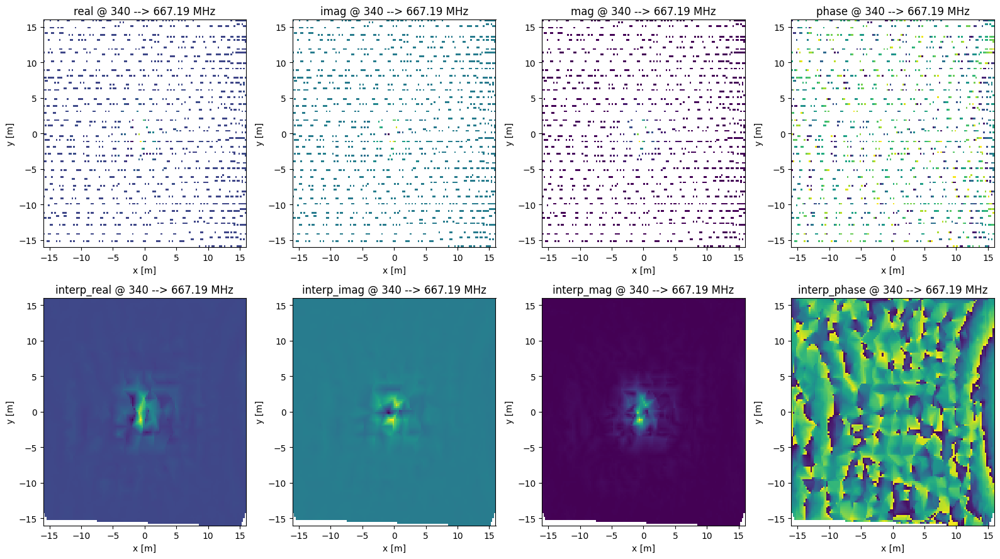

In [111]:
fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,9))
find=340
ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.V_LC_cross.real[:,:,find,0,0])
ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.V_LC_cross.imag[:,:,find,0,0])
ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.abs(testbeam.V_LC_cross)[:,:,find,0,0])#,norm=LogNorm())
ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.angle(testbeam.V_LC_cross)[:,:,find,0,0])

ax5.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp.real[:,:,find,0])
ax6.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp.imag[:,:,find,0])
ax7.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp_amp[:,:,find,0])#,norm=LogNorm())
ax8.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp_phase[:,:,find,0])

titles=['real','imag','mag','phase','interp_real','interp_imag','interp_mag','interp_phase']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i]+' @ {} --> {:.2f} MHz'.format(find,testbeam.freq[find]))
    ax.set_xlabel('x [m]')
    ax.set_ylabel('y [m]')
tight_layout()

95

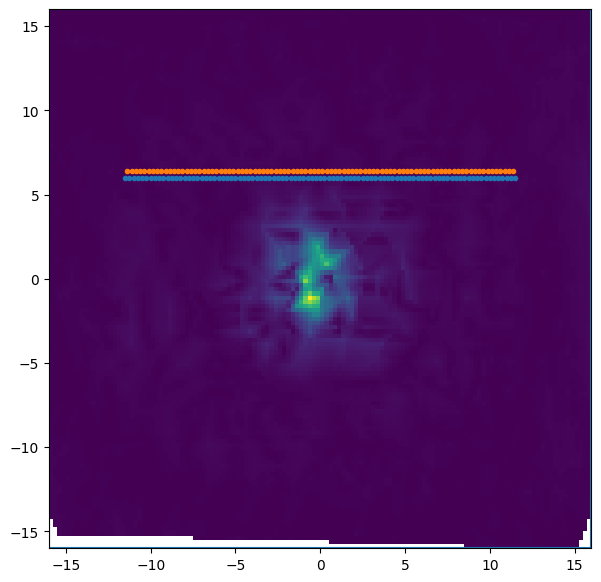

In [112]:
fig,ax1=subplots(nrows=1,ncols=1,figsize=(7,7))
ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp_amp[:,:,find,0])

testbeam.x_centers_grid.shape
177/2
ax1.axhline(16)
ax1.axhline(-16)
ax1.axvline(16)
ax1.axvline(-16)

plot(testbeam.x_edges_grid[18:-18,0,0],testbeam.y_edges_grid[18:-18,88,0],'.')
plot(testbeam.x_centers_grid[18:-18,0,0],testbeam.y_centers_grid[18:-18,89,0],'.')
len(testbeam.x_edges[17:-17])

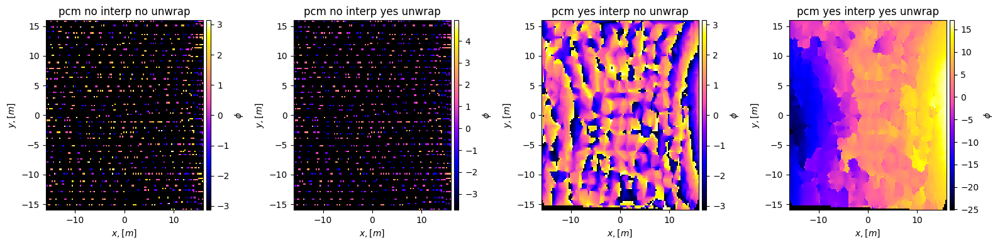

In [120]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
find=340
phi1=np.angle(testbeam.V_LC_cross[:,:,find,0,0])
phiunwrap=unwrap2d(phi1)
phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i)

im1=ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi1,cmap='gnuplot2')
im2=ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phiunwrap,cmap='gnuplot2')
im3=ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_i,cmap='gnuplot2')
im4=ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_iunwrap,cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["pcm no interp no unwrap","pcm no interp yes unwrap","pcm yes interp no unwrap","pcm yes interp yes unwrap"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
# for ax in [ax2,ax5,ax6]:
#     ax.plot(range(-20,20),range(-20,20),'r-',linewidth=10)
tight_layout()


(A,B,C)=(5.436,0.209,-0.829)
(D,E,F)=(11.854,-7.616,15.083)
G=0.200


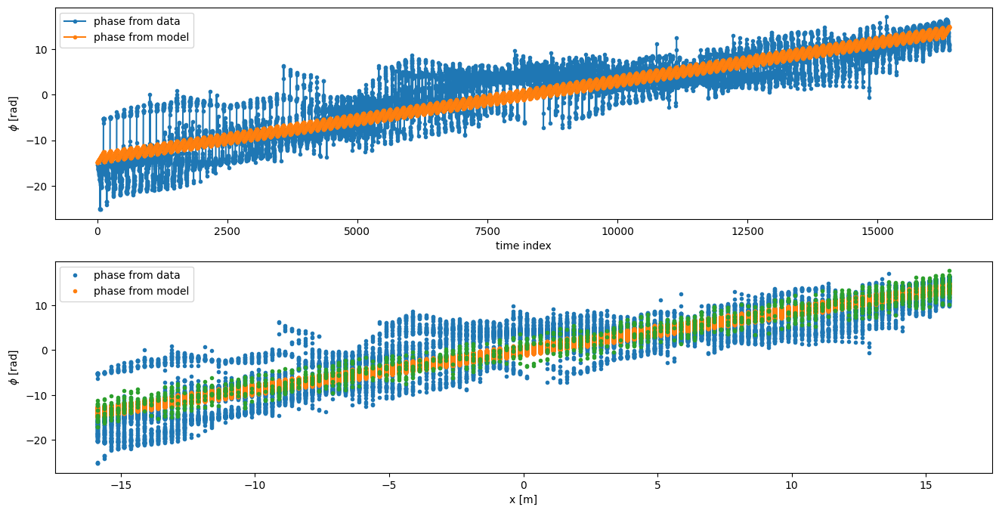

In [121]:
dx=testbeam.x_centers_grid[:,:,0]
dy=testbeam.y_centers_grid[:,:,1]
wl=(3.0e8/(testbeam.freq[find]/1e-6))
dc=(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcabs=np.abs(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcang=phi_iunwrap.flatten()

dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(18*np.ones((dx.shape[0]*dx.shape[1]))).flatten()

# dxax=np.linspace(-10,10,1000)
# dyax=np.linspace(-10,10,1000)
# griddx,griddy=np.meshgrid(dxax,dyax)
# sqware=np.outer(dxax,dyax)

popt=least_squares(Fringe_Fit,x0=np.array([1.4,0.0,0.25,4.0,0.0,0.5,0.2]),args=[dcoords[~np.isnan(dcang)],dcang[~np.isnan(dcang)]]).x
print("(A,B,C)=({:.3f},{:.3f},{:.3f})".format(2*np.pi*popt[0],2*np.pi*wl*popt[1],2*np.pi*wl*popt[2]))
print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[6]))
#print(Fringe(popt,dcoords[tcut]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,8))
ax1.plot(dcang,'.-',label='phase from data')
ax1.plot(Fringe(np.array(popt),dcoords),'.-',label='phase from model')
ax1.set_xlabel("time index")
ax1.set_ylabel("$\phi$ [rad]")
ax1.legend()
ax2.plot(dcoords[:,0],dcang,'.',label='phase from data')
ax2.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'.',label='phase from model')
ax2.plot(testbeam.x_centers_grid[:,:,0].flatten(),(phi1+Fringe(np.array(popt),dcoords).reshape(testbeam.V_LC_cross[:,:,find,0,0].shape)).flatten(),'.')
#ax2.plot(dcoords[tcut][:,0],Fringe(np.array([1.5,0.1,0.4,0.0,0.0,0.9,0.9]),dcoords[tcut]),'.',label='phase from model')
ax2.set_xlabel("x [m]")
ax2.set_ylabel("$\phi$ [rad]")
ax2.legend()



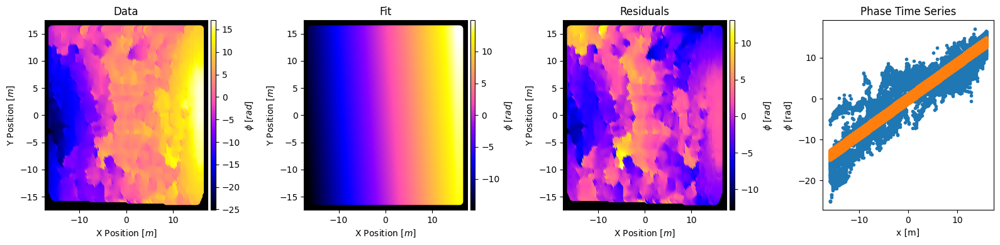

In [122]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im2=ax2.scatter(dx,dy,s=50,c=Fringe(popt,dcoords),cmap='gnuplot2')
#im2=ax2.pcolormesh(dxax,dyax,Fringe(popt,np.array([griddx.flatten(),griddy.flatten(),30*np.ones(len(griddx.flatten()))]).T).reshape(griddx.shape),cmap='gnuplot2',alpha=0.6)
#im1=ax2.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im3=ax3.scatter(dx,dy,s=50,c=(dcang-Fringe(popt,dcoords)),cmap='gnuplot2')
ax4.plot(dcoords[:,0],dcang,'.')
ax4.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


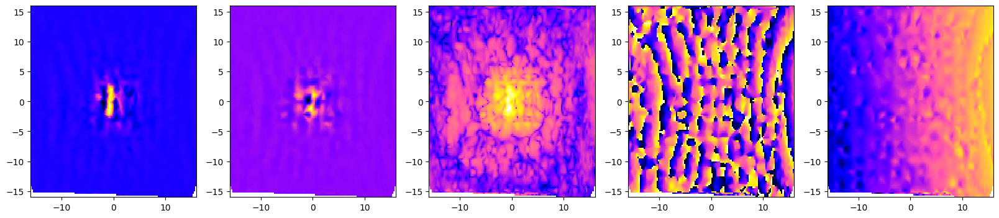

In [123]:
noNans = np.isfinite(testbeam.V_LC_cross[:,:,340,0,0]) # all x, y, chosen frequency and channel
x_noNan = testbeam.x_centers_grid[noNans,0]
y_noNan = testbeam.y_centers_grid[noNans,0]

x_interp=testbeam.x_centers[:,0]
y_interp=testbeam.y_centers[:,0]
x_interp_grid,y_interp_grid=np.meshgrid(x_interp,y_interp,indexing='ij')

fig,[ax1,ax2,ax3,ax4,ax5]=subplots(nrows=1,ncols=5,figsize=(20,4))
interp_re = griddata((x_noNan,y_noNan), np.real(testbeam.V_LC_cross[:,:,340,0,0][noNans]), (x_interp_grid,y_interp_grid), method='cubic')
interp_im = griddata((x_noNan,y_noNan), np.imag(testbeam.V_LC_cross[:,:,340,0,0][noNans]), (x_interp_grid,y_interp_grid), method='cubic')
interp_c = interp_re + 1.0j*interp_im
interp_phi = griddata((x_noNan,y_noNan),(np.angle(testbeam.V_LC_cross[:,:,340,0,0])+Fringe(np.array(popt),dcoords).reshape(testbeam.V_LC_cross[:,:,find,0,0].shape))[noNans], (x_interp_grid,y_interp_grid), method='cubic')

ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],interp_re,cmap='gnuplot2')
ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],interp_im,cmap='gnuplot2')
ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.abs(interp_c),cmap='gnuplot2',norm=LogNorm())
ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.angle(interp_c),cmap='gnuplot2')
ax5.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],interp_phi,cmap='gnuplot2')


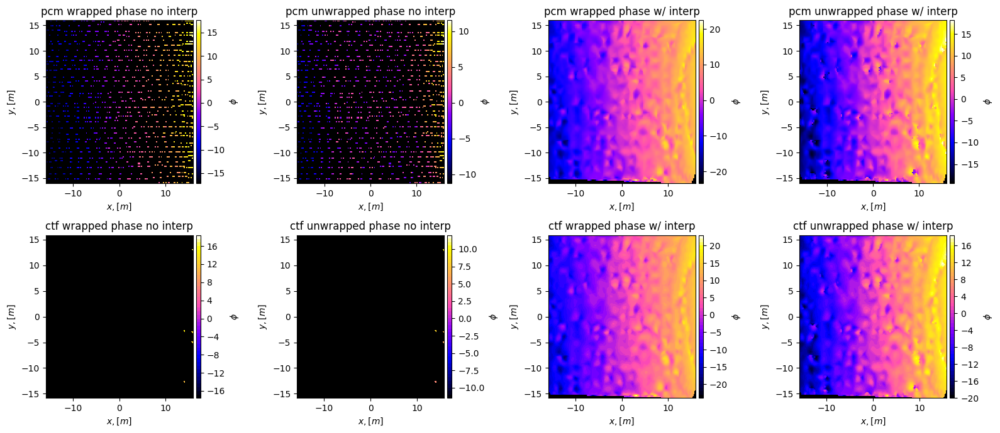

In [124]:
phi_re=(np.angle(testbeam.V_LC_cross[:,:,find,0,0])+Fringe(np.array(popt),dcoords).reshape(testbeam.V_LC_cross[:,:,find,0,0].shape))
phi_reunwrap=unwrap2d(phi_re)

phi_rei=interp_phi
phi_reiunwrap=unwrap2d(phi_rei)

fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,7))
im1=ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_re,cmap='gnuplot2')
im2=ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_reunwrap,cmap='gnuplot2')
im3=ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_rei,cmap='gnuplot2')
im4=ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_reiunwrap,cmap='gnuplot2')
im5=ax5.contourf(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_re,50,cmap='gnuplot2')
im6=ax6.contourf(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_reunwrap,50,cmap='gnuplot2')
im7=ax7.contourf(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_rei,50,cmap='gnuplot2')
im8=ax8.contourf(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_reiunwrap,50,cmap='gnuplot2')
images=[im1,im2,im3,im4,im5,im6,im7,im8]
titles=["pcm wrapped phase no interp","pcm unwrapped phase no interp","pcm wrapped phase w/ interp","pcm unwrapped phase w/ interp",\
        "ctf wrapped phase no interp","ctf unwrapped phase no interp","ctf wrapped phase w/ interp","ctf unwrapped phase w/ interp"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
tight_layout()

(A,B,C)=(5.436,0.209,-0.829)
(D,E,F)=(11.854,-7.616,15.083)
G=0.200
(A,B,C)=(5.381,0.213,-0.562)
(D,E,F)=(6.265,1.227,8.358)
G=0.200


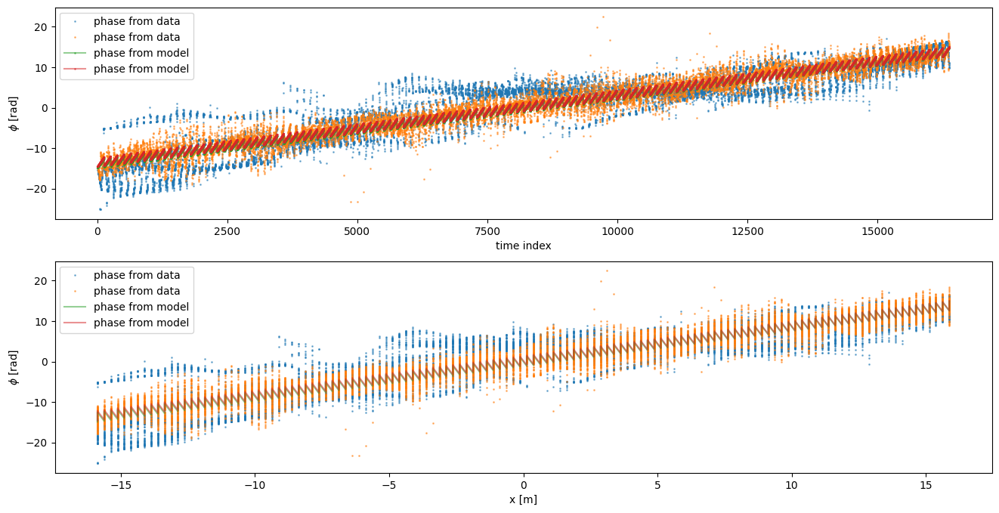

In [125]:
popt=least_squares(Fringe_Fit,x0=np.array([1.4,0.0,0.25,4.0,0.0,0.5,0.2]),args=[dcoords[~np.isnan(dcang)],dcang[~np.isnan(dcang)]]).x
print("(A,B,C)=({:.3f},{:.3f},{:.3f})".format(2*np.pi*popt[0],2*np.pi*wl*popt[1],2*np.pi*wl*popt[2]))
print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[6]))
#print(Fringe(popt,dcoords[tcut]))

popt2=least_squares(Fringe_Fit,x0=np.array([1.4,0.0,0.25,0.0,0.0,0.5,0.2]),args=[dcoords[~np.isnan(interp_phi.flatten())],interp_phi[~np.isnan(interp_phi)].flatten()]).x
print("(A,B,C)=({:.3f},{:.3f},{:.3f})".format(2*np.pi*popt2[0],2*np.pi*wl*popt2[1],2*np.pi*wl*popt2[2]))
print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt2[3],popt2[4],popt2[5]))
print("G={:.3f}".format(popt2[6]))
#print(Fringe(popt,dcoords[tcut]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,8))
ax1.plot(dcang,'.',alpha=0.5,markersize=2,label='phase from data')
ax1.plot(interp_phi.flatten(),'.',alpha=0.5,markersize=2,label='phase from data')
ax1.plot(Fringe(np.array(popt),dcoords),'.-',alpha=0.5,markersize=2,label='phase from model')
ax1.plot(Fringe(np.array(popt2),dcoords),'.-',alpha=0.5,markersize=2,label='phase from model')
ax1.set_xlabel("time index")
ax1.set_ylabel("$\phi$ [rad]")
ax1.legend()
ax2.plot(dcoords[:,0],dcang,'.',alpha=0.5,markersize=2,label='phase from data')
ax2.plot(dcoords[:,0],interp_phi.flatten(),'.',alpha=0.5,markersize=2,label='phase from data')
ax2.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'-',alpha=0.5,markersize=2,label='phase from model')
ax2.plot(dcoords[:,0],Fringe(np.array(popt2),dcoords),'-',alpha=0.5,markersize=2,label='phase from model')

#ax2.plot(testbeam.x_centers_grid[:,:,0].flatten(),(phi1+Fringe(np.array(popt),dcoords).reshape(128,128)).flatten(),'.')
#ax2.plot(dcoords[tcut][:,0],Fringe(np.array([1.5,0.1,0.4,0.0,0.0,0.9,0.9]),dcoords[tcut]),'.',label='phase from model')
ax2.set_xlabel("x [m]")
ax2.set_ylabel("$\phi$ [rad]")
ax2.legend()

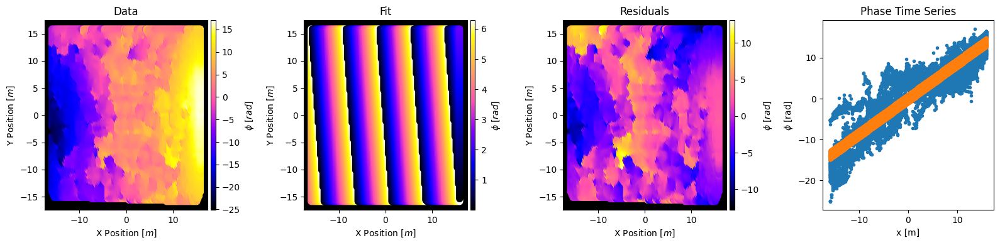

In [126]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im2=ax2.scatter(dx,dy,s=50,c=Fringe(popt,dcoords)%(2*np.pi),cmap='gnuplot2')
#im2=ax2.pcolormesh(dxax,dyax,Fringe(popt,np.array([griddx.flatten(),griddy.flatten(),30*np.ones(len(griddx.flatten()))]).T).reshape(griddx.shape),cmap='gnuplot2',alpha=0.6)
#im1=ax2.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im3=ax3.scatter(dx,dy,s=50,c=(dcang-Fringe(popt,dcoords)),cmap='gnuplot2')
ax4.plot(dcoords[:,0],dcang,'.')
ax4.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()

In [58]:
def Fringe_Spacing(freq,find,h,b,x=0):
    
    f = freq
    wavelength=3e8/(f*1e6)
    print('lambda at f_ind 345: {}'.format(wavelength))
    
    if x==0:
        theta=np.pi/2
    else:
        theta = np.arctan(h/np.abs(x))
        
    print(np.sin(theta))
    dtheta=wavelength/(b*np.sin(theta))
    print('delta theta at find={} in radians: {}'.format(find,dtheta))
    x_dist = h*np.tan(dtheta)
    print('Delta_x: {}'.format(x_dist))
    
    return x_dist

In [61]:
Fringe_Spacing(testbeam.freq[340],340,20,13.5,x=testbeam.x_centers[50,0])

lambda at f_ind 345: 0.4496487119437939
0.5605146115728086
delta theta at find=340 in radians: 0.0594227363714498
Delta_x: 1.1898555416230296


1.1898555416230296

In [60]:
np.arctan(20/np.abs(testbeam.x_centers[50,0]))

0.5950070725094485